# SegNet  
- Pytorch로 논문 구현  
- Data: CamVid (from Kaggle)
    - Train: 369개, Valid: 100개, Test: 232개
    
- accuracy를 측정할 metric으로는 mIoU score와 BF score를 사용

# Packages and Modules

In [1]:
# packages and modules
import os
import time
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, ReduceLROnPlateau, StepLR, MultiStepLR, CyclicLR, CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from pytorchtools import EarlyStopping, CheckPoint, Metrics, FocalLoss
from segnet_utils import load_image_with_resize

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize'] = [10,7]

# Load Data

In [3]:
# 클래스 디렉토리 데이터 불러오기
data = pd.read_csv('./camvid/11_class_dict.csv', index_col=0)
data

,r,g,b
name,,,
Sky,128,128,128
Building,128,0,0
Pole,192,192,128
Road,128,64,128
Sidewalk,0,0,192
Tree,128,128,0
SignSymbol,192,128,128
Fence,64,64,128
Car,64,0,128


In [4]:
rgb_data = {name:list(data.loc[name, :]) for name in data.index}
rgb_array = {idx:np.array(rgb) for idx, (_, rgb) in enumerate(rgb_data.items())}

In [5]:
width = 224
height = 224
num_classes = len(data) # 12 classes (11 object classes and 1 background class)

# cuda setting
device = torch.device('cuda')
print(device)

cuda


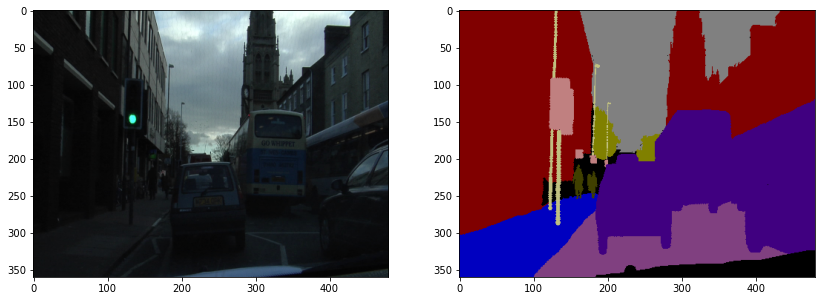

In [6]:
# show sample image
ex1 = Image.open('./camvid/train/train_images/0001TP_006690.png')
ex2 = Image.open('./camvid/train/train_labels/0001TP_006690_L.png')
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.imshow(ex1)
plt.subplot(122)
plt.imshow(ex2)
plt.show()

In [7]:
# load image data with resize
path = './camvid/'
train_image, train_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='train')
valid_image, valid_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='valid')
test_image, test_label = load_image_with_resize(path, 
                                                n_pixel_L=width, n_pixel_R=height, 
                                                subset='test')

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

In [8]:
# image to 12 classes mask
def image2mask(labels):
    semantic_map = []
    for color in tqdm(list(rgb_data.values())):
        equality = np.equal(labels, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    return np.float32(semantic_map)

train_mask = image2mask(train_label)
valid_mask = image2mask(valid_label)
test_mask = image2mask(test_label)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

In [9]:
# custom data set
class CamVidDataset(Dataset):
    def __init__(self, transforms_, subset='train', predict_train=False):
        self.transforms = transforms.Compose(transforms_)
        if subset=='train':
            if predict_train:
                self.images = train_image[:100]
                self.labels = train_mask[:100]
            else:
                self.images = train_image
                self.labels = train_mask
        elif subset=='valid':
            self.images = valid_image
            self.labels = valid_mask
        else:
            self.images = test_image
            self.labels = test_mask
            
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        images = self.images[idx]
        labels = self.labels[idx]
        return self.transforms(images), self.transforms(labels)

In [10]:
batch_size = 12

transforms_ = [
    transforms.ToTensor(),
]

train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

valid_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='valid'),
    batch_size=len(valid_image),
    shuffle=True,
    drop_last=True
)

## Build Model

In [11]:
class EncoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(EncoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [12]:
class DecoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DecoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [13]:
class SegNet(nn.Module):
    def __init__(self, in_dim=3, out_dim=num_classes, num_filters=64):
        super(SegNet, self).__init__()
        
        self.vgg16 = models.vgg16(pretrained=True)
        
        self.MaxPooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        
        self.encoder1 = EncoderBlock(in_dim, num_filters)
        self.encoder2 = EncoderBlock(num_filters, num_filters)
        
        self.encoder3 = EncoderBlock(num_filters, num_filters*2)
        self.encoder4 = EncoderBlock(num_filters*2, num_filters*2)
        
        self.encoder5 = EncoderBlock(num_filters*2, num_filters*4)
        self.encoder6 = EncoderBlock(num_filters*4, num_filters*4)
        self.encoder7 = EncoderBlock(num_filters*4, num_filters*4)
        
        self.encoder8 = EncoderBlock(num_filters*4, num_filters*8)
        self.encoder9 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder10 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.encoder11 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder12 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder13 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.get_vgg_weigts()
        
        
        self.UnMaxPooling = nn.MaxUnpool2d(kernel_size=2, stride=2)
        
        self.decoder1 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder2 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder3 = DecoderBlock(num_filters*8, num_filters*8)
        
        self.decoder4 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder5 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder6 = DecoderBlock(num_filters*8, num_filters*4)
        
        self.decoder7 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder8 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder9 = DecoderBlock(num_filters*4, num_filters*2)
        
        self.decoder10 = DecoderBlock(num_filters*2, num_filters*2)
        self.decoder11 = DecoderBlock(num_filters*2, num_filters)
        
        self.decoder12 = DecoderBlock(num_filters, num_filters)
        self.decoder13 = DecoderBlock(num_filters, out_dim)
        
    def forward(self, x):

        size1 = x.size()
        x = self.encoder1(x)
        x = self.encoder2(x)
        x, idx1 = self.MaxPooling(x)

        size2 = x.size()
        x = self.encoder3(x)
        x = self.encoder4(x)
        x, idx2 = self.MaxPooling(x)

        size3 = x.size()
        x = self.encoder5(x)
        x = self.encoder6(x)
        x = self.encoder7(x)
        x, idx3 = self.MaxPooling(x)

        size4 = x.size()
        x = self.encoder8(x)
        x = self.encoder9(x)
        x = self.encoder10(x)
        x, idx4 = self.MaxPooling(x)

        size5 = x.size()
        x = self.encoder11(x)
        x = self.encoder12(x)
        x = self.encoder13(x)
        x, idx5 = self.MaxPooling(x)

        
        x = self.UnMaxPooling(x, idx5, output_size=size5)
        x = self.decoder1(x)
        x = self.decoder2(x)
        x = self.decoder3(x)

        x = self.UnMaxPooling(x, idx4, output_size=size4)
        x = self.decoder4(x)
        x = self.decoder5(x)
        x = self.decoder6(x)

        x = self.UnMaxPooling(x, idx3, output_size=size3)
        x = self.decoder7(x)
        x = self.decoder8(x)
        x = self.decoder9(x)

        x = self.UnMaxPooling(x, idx2, output_size=size2)
        x = self.decoder10(x)
        x = self.decoder11(x)

        x = self.UnMaxPooling(x, idx1, output_size=size1)
        x = self.decoder12(x)
        out = self.decoder13(x)
        
        return out
    
    def get_vgg_weigts(self):
        assert self.encoder1.block[0].weight.size() == self.vgg16.features[0].weight.size()
        self.encoder1.block[0].weight.data = self.vgg16.features[0].weight.data
        assert self.encoder1.block[0].bias.size() == self.vgg16.features[0].bias.size()
        self.encoder1.block[0].bias.data = self.vgg16.features[0].bias.data

        assert self.encoder2.block[0].weight.size() == self.vgg16.features[2].weight.size()
        self.encoder2.block[0].weight.data = self.vgg16.features[2].weight.data
        assert self.encoder2.block[0].bias.size() == self.vgg16.features[2].bias.size()
        self.encoder2.block[0].bias.data = self.vgg16.features[2].bias.data

        assert self.encoder3.block[0].weight.size() == self.vgg16.features[5].weight.size()
        self.encoder3.block[0].weight.data = self.vgg16.features[5].weight.data
        assert self.encoder3.block[0].bias.size() == self.vgg16.features[5].bias.size()
        self.encoder3.block[0].bias.data = self.vgg16.features[5].bias.data

        assert self.encoder4.block[0].weight.size() == self.vgg16.features[7].weight.size()
        self.encoder4.block[0].weight.data = self.vgg16.features[7].weight.data
        assert self.encoder4.block[0].bias.size() == self.vgg16.features[7].bias.size()
        self.encoder4.block[0].bias.data = self.vgg16.features[7].bias.data

        assert self.encoder5.block[0].weight.size() == self.vgg16.features[10].weight.size()
        self.encoder5.block[0].weight.data = self.vgg16.features[10].weight.data
        assert self.encoder5.block[0].bias.size() == self.vgg16.features[10].bias.size()
        self.encoder5.block[0].bias.data = self.vgg16.features[10].bias.data

        assert self.encoder6.block[0].weight.size() == self.vgg16.features[12].weight.size()
        self.encoder6.block[0].weight.data = self.vgg16.features[12].weight.data
        assert self.encoder6.block[0].bias.size() == self.vgg16.features[12].bias.size()
        self.encoder6.block[0].bias.data = self.vgg16.features[12].bias.data

        assert self.encoder7.block[0].weight.size() == self.vgg16.features[14].weight.size()
        self.encoder7.block[0].weight.data = self.vgg16.features[14].weight.data
        assert self.encoder7.block[0].bias.size() == self.vgg16.features[14].bias.size()
        self.encoder7.block[0].bias.data = self.vgg16.features[14].bias.data

        assert self.encoder8.block[0].weight.size() == self.vgg16.features[17].weight.size()
        self.encoder8.block[0].weight.data = self.vgg16.features[17].weight.data
        assert self.encoder8.block[0].bias.size() == self.vgg16.features[17].bias.size()
        self.encoder8.block[0].bias.data = self.vgg16.features[17].bias.data

        assert self.encoder9.block[0].weight.size() == self.vgg16.features[19].weight.size()
        self.encoder9.block[0].weight.data = self.vgg16.features[19].weight.data
        assert self.encoder9.block[0].bias.size() == self.vgg16.features[19].bias.size()
        self.encoder9.block[0].bias.data = self.vgg16.features[19].bias.data

        assert self.encoder10.block[0].weight.size() == self.vgg16.features[21].weight.size()
        self.encoder10.block[0].weight.data = self.vgg16.features[21].weight.data
        assert self.encoder10.block[0].bias.size() == self.vgg16.features[21].bias.size()
        self.encoder10.block[0].bias.data = self.vgg16.features[21].bias.data

        assert self.encoder11.block[0].weight.size() == self.vgg16.features[24].weight.size()
        self.encoder11.block[0].weight.data = self.vgg16.features[24].weight.data
        assert self.encoder11.block[0].bias.size() == self.vgg16.features[24].bias.size()
        self.encoder11.block[0].bias.data = self.vgg16.features[24].bias.data

        assert self.encoder12.block[0].weight.size() == self.vgg16.features[26].weight.size()
        self.encoder12.block[0].weight.data = self.vgg16.features[26].weight.data
        assert self.encoder12.block[0].bias.size() == self.vgg16.features[26].bias.size()
        self.encoder12.block[0].bias.data = self.vgg16.features[26].bias.data

        assert self.encoder13.block[0].weight.size() == self.vgg16.features[28].weight.size()
        self.encoder13.block[0].weight.data = self.vgg16.features[28].weight.data
        assert self.encoder13.block[0].bias.size() == self.vgg16.features[28].bias.size()
        self.encoder13.block[0].bias.data = self.vgg16.features[28].bias.data

In [14]:
model = SegNet().to(device)
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
      EncoderBlock-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
              ReLU-7         [-1, 64, 224, 224]               0
      EncoderBlock-8         [-1, 64, 224, 224]               0
         MaxPool2d-9  [[-1, 64, 112, 112], [-1, 64, 112, 112]]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
             ReLU-12        [-1, 128, 112, 112]               0
     EncoderBlock-13        [-1, 128, 112, 112]               0
           Conv2d-14    

# Median Frequency Balancing

In [15]:
# class balance of train data set 
train_class_labels = list(rgb_data.keys())
print(train_class_labels)

['Sky', 'Building', 'Pole', 'Road', 'Sidewalk', 'Tree', 'SignSymbol', 'Fence', 'Car', 'Pedestrian', 'Bicyclist', 'unlabelled']


In [16]:
# median frequency balancing
train_class_count = [2925992, 4164714, 113525, 5769970, 771679, 1666212, 191065, 195738,
                     1040037, 97657, 48378, 607456]
weights = torch.tensor(train_class_count, dtype=torch.float32)
median_weights = weights.median()
median_frequency_balancing = median_weights/weights
print(median_frequency_balancing)

tensor([ 0.2076,  0.1459,  5.3509,  0.1053,  0.7872,  0.3646,  3.1793,  3.1034,
         0.5841,  6.2203, 12.5565,  1.0000])


# Set Loss function, Optimizer, learning rate scheduler and early stopping  

**class imbalance problem**  
- using median frequency balancing  
$$weight = freq\, median \,/\, freq(c)$$  

**loss function**
- loss : weighted cross entropy loss
$$CE = -\sum y_{true}\log\left({y_{pred}}\right)$$  
$$Weighted\,CE = -\sum w\times y_{true}\log\left({y_{pred}}\right)$$

- Focal Loss  
$$CE\left(p_t\right)=-\log\left(p_t\right)$$  
$$FL\left(p_t\right)=-\alpha\left(1-p_t\right)^{\gamma}\log\left(p_t\right)$$

**RAdam (Rectified Adam)**  
- Adam에서 학습 초기에 샘플이 부족해 adaptive learning rate의 분산이 매우 커짐에 따라 local optima에 일찍 도달하는 문제를 해결한 optimizer

In [17]:
# set learning rate scheduler to reduce loss
lr = 1e-5
es_save_path = './model/es_checkpoint.pt'
cp_save_path = './model/cp_checkpoint.pt'
loss_func = nn.CrossEntropyLoss(weight=median_frequency_balancing).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=30, T_mult=2, )
# lr_scheduler = ReduceLROnPlateau(optimizer, 'min', patience=30, factor=0.5, verbose=True)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-6, verbose=True)
# lr_scheduler = CosineAnnealingWarmUpRestarts(optimizer, T_0=100, T_mult=1, eta_max=0.1,  T_up=10, gamma=0.5)
# lr_scheduler = StepLR(optimizer, step_size=50, gamma=0.1, verbose=True)
# lr_scheduler = MultiStepLR(optimizer, milestones=[200,400], gamma=0.5, verbose=True)
# lr_scheduler = CyclicLR(optimizer, base_lr=0.00001, step_size_up=5, max_lr=0.001, mode='triangular2', cycle_momentum=False)
checkpoint = CheckPoint(verbose=True, path=cp_save_path)
early_stopping = EarlyStopping(patience=100, verbose=True, path=es_save_path)
metric = Metrics(n_classes=num_classes, dim=1) # mIoU and bf score

# Train Model

In [18]:
# define model training function
def train(model, 
          train_data, 
          validation_data,
          epochs,
          learning_rate_scheduler=False,
          check_point=False,
          early_stop=False,
          last_epoch_save_path='./model/last_checkpoint.pt'):
    # create empty list to append losses and miou of train, valid
    loss_list, miou_list, bf_list = [], [], []
    val_loss_list, val_miou_list, val_bf_list = [], [], []
    # train the model
    model.train()
    starting = time.time()
    # start training
    for epoch in tqdm(range(epochs)):
        init_time = time.time()
        # train by batch
        for train_images, train_labels in train_data:
            train_images = train_images.to(device)
            train_labels = train_labels.to(device)
            # initialize the gradient to 0
            optimizer.zero_grad()
            
            output_images = model(train_images)
            loss = loss_func(output_images, train_labels)
            miou = metric.get_miou(output_images, train_labels)
            bf = metric.get_f1_score(output_images, train_labels)
            
            # update loss and optimizer
            loss.backward()
            optimizer.step()
            
        end_time = time.time()
        loss_list.append(loss.item())
        miou_list.append(miou.item())
        bf_list.append(bf.item())
        # check epoch, loss, miou and time
        print(f'\n[Epoch {epoch+1}/{epochs}]'
              f'  [time: {end_time-init_time:.3f}s]'
              f'  [lr = {optimizer.param_groups[0]["lr"]}]')
        print(f'[train loss: {loss.item():.3f}]'
              f'  [train mIoU: {miou.item():.3f}]'
              f'  [train BF: {bf.item():.3f}]')
                
        # validate the model
        with torch.no_grad():
            for val_images, val_labels in validation_data:
                val_images, val_labels = val_images.to(device), val_labels.to(device)
                
                val_outputs = model(val_images)
                val_loss = loss_func(val_outputs, val_labels)
                val_miou = metric.get_miou(val_outputs, val_labels)
                val_bf = metric.get_f1_score(val_outputs, val_labels)
                
                if learning_rate_scheduler:
                    lr_scheduler.step(val_loss)
                
            val_loss_list.append(val_loss.item())
            val_miou_list.append(val_miou.item())
            val_bf_list.append(val_bf.item())
            # check loss and miou of validation
            print(f'[valid loss: {val_loss.item():.3f}]'
                  f'  [valid mIoU: {val_miou.item():.3f}]'
                  f'  [valid BF: {val_bf.item():.3f}]')
            
        # save model check point
        if check_point:
            checkpoint(val_loss, model)
        
        # set early stopping
        if early_stop:
            assert check_point==False
            early_stopping(val_loss, model)
            if early_stopping.early_stop:
                print('\n##########################\n'
                      '##### Early Stopping #####\n'
                      '##########################')
                break
            
    # if we not set early stopping, the model save at the end of training
    if early_stop==False and check_point==False:
        torch.save(model.state_dict(), last_epoch_save_path)
        print('Saving model of last epoch')
        
    ending = time.time()
    print(f'\nTotal time for training is {ending-starting:.3f}s')
    
    return model, loss_list, miou_list, bf_list, val_loss_list, val_miou_list, val_bf_list

In [19]:
# model training
EPOCH = 3000

model, train_loss, train_miou, train_bf, valid_loss, valid_miou, valid_bf = train(
    model,
    train_loader,
    validation_data=valid_loader,
    epochs=EPOCH,
    learning_rate_scheduler=False,
    check_point=True,
    early_stop=False,
)

  0%|          | 0/3000 [00:00<?, ?it/s]


[Epoch 1/3000]  [time: 4.543s]  [lr = 1e-05]
[train loss: 0.935]  [train mIoU: 0.023]  [train BF: 0.142]
[valid loss: 1.667]  [valid mIoU: 0.027]  [valid BF: 0.144]
Validation loss decreased (inf --> 1.667).  Saving model ...

[Epoch 2/3000]  [time: 4.086s]  [lr = 1e-05]
[train loss: 1.000]  [train mIoU: 0.024]  [train BF: 0.143]
[valid loss: 1.657]  [valid mIoU: 0.028]  [valid BF: 0.146]
Validation loss decreased (1.667 --> 1.657).  Saving model ...

[Epoch 3/3000]  [time: 4.031s]  [lr = 1e-05]
[train loss: 1.005]  [train mIoU: 0.043]  [train BF: 0.146]
[valid loss: 1.641]  [valid mIoU: 0.040]  [valid BF: 0.149]
Validation loss decreased (1.657 --> 1.641).  Saving model ...

[Epoch 4/3000]  [time: 4.043s]  [lr = 1e-05]
[train loss: 1.026]  [train mIoU: 0.053]  [train BF: 0.152]
[valid loss: 1.594]  [valid mIoU: 0.055]  [valid BF: 0.154]
Validation loss decreased (1.641 --> 1.594).  Saving model ...

[Epoch 5/3000]  [time: 4.040s]  [lr = 1e-05]
[train loss: 0.868]  [train mIoU: 0.064]

[valid loss: 1.124]  [valid mIoU: 0.345]  [valid BF: 0.202]

[Epoch 45/3000]  [time: 4.482s]  [lr = 1e-05]
[train loss: 0.353]  [train mIoU: 0.479]  [train BF: 0.207]
[valid loss: 1.101]  [valid mIoU: 0.351]  [valid BF: 0.203]

[Epoch 46/3000]  [time: 4.463s]  [lr = 1e-05]
[train loss: 0.364]  [train mIoU: 0.435]  [train BF: 0.205]
[valid loss: 1.139]  [valid mIoU: 0.347]  [valid BF: 0.203]

[Epoch 47/3000]  [time: 4.546s]  [lr = 1e-05]
[train loss: 0.341]  [train mIoU: 0.492]  [train BF: 0.206]
[valid loss: 1.140]  [valid mIoU: 0.348]  [valid BF: 0.203]

[Epoch 48/3000]  [time: 4.547s]  [lr = 1e-05]
[train loss: 0.348]  [train mIoU: 0.418]  [train BF: 0.204]
[valid loss: 1.130]  [valid mIoU: 0.353]  [valid BF: 0.203]

[Epoch 49/3000]  [time: 4.435s]  [lr = 1e-05]
[train loss: 0.336]  [train mIoU: 0.460]  [train BF: 0.205]
[valid loss: 1.114]  [valid mIoU: 0.353]  [valid BF: 0.203]

[Epoch 50/3000]  [time: 4.513s]  [lr = 1e-05]
[train loss: 0.332]  [train mIoU: 0.439]  [train BF: 0.208


[Epoch 94/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.219]  [train mIoU: 0.539]  [train BF: 0.217]
[valid loss: 1.151]  [valid mIoU: 0.407]  [valid BF: 0.210]

[Epoch 95/3000]  [time: 4.081s]  [lr = 1e-05]
[train loss: 0.210]  [train mIoU: 0.601]  [train BF: 0.219]
[valid loss: 1.115]  [valid mIoU: 0.415]  [valid BF: 0.210]

[Epoch 96/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.231]  [train mIoU: 0.580]  [train BF: 0.217]
[valid loss: 1.125]  [valid mIoU: 0.414]  [valid BF: 0.210]

[Epoch 97/3000]  [time: 4.112s]  [lr = 1e-05]
[train loss: 0.205]  [train mIoU: 0.542]  [train BF: 0.216]
[valid loss: 1.153]  [valid mIoU: 0.407]  [valid BF: 0.210]

[Epoch 98/3000]  [time: 4.070s]  [lr = 1e-05]
[train loss: 0.206]  [train mIoU: 0.598]  [train BF: 0.218]
[valid loss: 1.149]  [valid mIoU: 0.413]  [valid BF: 0.210]

[Epoch 99/3000]  [time: 4.075s]  [lr = 1e-05]
[train loss: 0.203]  [train mIoU: 0.594]  [train BF: 0.218]
[valid loss: 1.136]  [valid mIoU: 0.416]  [valid BF: 0.211


[Epoch 143/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.189]  [train mIoU: 0.557]  [train BF: 0.217]
[valid loss: 1.136]  [valid mIoU: 0.433]  [valid BF: 0.214]

[Epoch 144/3000]  [time: 4.080s]  [lr = 1e-05]
[train loss: 0.181]  [train mIoU: 0.605]  [train BF: 0.222]
[valid loss: 1.178]  [valid mIoU: 0.428]  [valid BF: 0.213]

[Epoch 145/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.195]  [train mIoU: 0.662]  [train BF: 0.222]
[valid loss: 1.138]  [valid mIoU: 0.436]  [valid BF: 0.214]

[Epoch 146/3000]  [time: 4.076s]  [lr = 1e-05]
[train loss: 0.186]  [train mIoU: 0.660]  [train BF: 0.222]
[valid loss: 1.143]  [valid mIoU: 0.438]  [valid BF: 0.214]

[Epoch 147/3000]  [time: 4.076s]  [lr = 1e-05]
[train loss: 0.175]  [train mIoU: 0.630]  [train BF: 0.221]
[valid loss: 1.165]  [valid mIoU: 0.431]  [valid BF: 0.214]

[Epoch 148/3000]  [time: 4.070s]  [lr = 1e-05]
[train loss: 0.186]  [train mIoU: 0.693]  [train BF: 0.224]
[valid loss: 1.172]  [valid mIoU: 0.434]  [valid BF:


[Epoch 192/3000]  [time: 4.086s]  [lr = 1e-05]
[train loss: 0.162]  [train mIoU: 0.678]  [train BF: 0.227]
[valid loss: 1.158]  [valid mIoU: 0.448]  [valid BF: 0.217]

[Epoch 193/3000]  [time: 4.119s]  [lr = 1e-05]
[train loss: 0.172]  [train mIoU: 0.668]  [train BF: 0.227]
[valid loss: 1.157]  [valid mIoU: 0.449]  [valid BF: 0.217]

[Epoch 194/3000]  [time: 4.117s]  [lr = 1e-05]
[train loss: 0.174]  [train mIoU: 0.631]  [train BF: 0.222]
[valid loss: 1.220]  [valid mIoU: 0.440]  [valid BF: 0.216]

[Epoch 195/3000]  [time: 4.305s]  [lr = 1e-05]
[train loss: 0.166]  [train mIoU: 0.678]  [train BF: 0.225]
[valid loss: 1.167]  [valid mIoU: 0.444]  [valid BF: 0.217]

[Epoch 196/3000]  [time: 4.472s]  [lr = 1e-05]
[train loss: 0.160]  [train mIoU: 0.615]  [train BF: 0.221]
[valid loss: 1.189]  [valid mIoU: 0.448]  [valid BF: 0.217]

[Epoch 197/3000]  [time: 4.562s]  [lr = 1e-05]
[train loss: 0.161]  [train mIoU: 0.729]  [train BF: 0.226]
[valid loss: 1.172]  [valid mIoU: 0.444]  [valid BF:


[Epoch 241/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.149]  [train mIoU: 0.684]  [train BF: 0.227]
[valid loss: 1.232]  [valid mIoU: 0.447]  [valid BF: 0.218]

[Epoch 242/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.150]  [train mIoU: 0.738]  [train BF: 0.229]
[valid loss: 1.184]  [valid mIoU: 0.451]  [valid BF: 0.219]

[Epoch 243/3000]  [time: 4.075s]  [lr = 1e-05]
[train loss: 0.148]  [train mIoU: 0.723]  [train BF: 0.229]
[valid loss: 1.224]  [valid mIoU: 0.448]  [valid BF: 0.218]

[Epoch 244/3000]  [time: 4.073s]  [lr = 1e-05]
[train loss: 0.162]  [train mIoU: 0.731]  [train BF: 0.227]
[valid loss: 1.209]  [valid mIoU: 0.449]  [valid BF: 0.218]

[Epoch 245/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.151]  [train mIoU: 0.703]  [train BF: 0.229]
[valid loss: 1.219]  [valid mIoU: 0.449]  [valid BF: 0.218]

[Epoch 246/3000]  [time: 4.071s]  [lr = 1e-05]
[train loss: 0.159]  [train mIoU: 0.730]  [train BF: 0.231]
[valid loss: 1.236]  [valid mIoU: 0.447]  [valid BF:


[Epoch 290/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.139]  [train mIoU: 0.699]  [train BF: 0.229]
[valid loss: 1.252]  [valid mIoU: 0.452]  [valid BF: 0.219]

[Epoch 291/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.137]  [train mIoU: 0.711]  [train BF: 0.231]
[valid loss: 1.222]  [valid mIoU: 0.456]  [valid BF: 0.220]

[Epoch 292/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.138]  [train mIoU: 0.689]  [train BF: 0.226]
[valid loss: 1.240]  [valid mIoU: 0.453]  [valid BF: 0.220]

[Epoch 293/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.140]  [train mIoU: 0.714]  [train BF: 0.228]
[valid loss: 1.243]  [valid mIoU: 0.452]  [valid BF: 0.219]

[Epoch 294/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.144]  [train mIoU: 0.694]  [train BF: 0.228]
[valid loss: 1.233]  [valid mIoU: 0.459]  [valid BF: 0.220]

[Epoch 295/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.135]  [train mIoU: 0.706]  [train BF: 0.231]
[valid loss: 1.225]  [valid mIoU: 0.456]  [valid BF:


[Epoch 339/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.139]  [train mIoU: 0.695]  [train BF: 0.229]
[valid loss: 1.280]  [valid mIoU: 0.457]  [valid BF: 0.221]

[Epoch 340/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.129]  [train mIoU: 0.725]  [train BF: 0.232]
[valid loss: 1.261]  [valid mIoU: 0.453]  [valid BF: 0.221]

[Epoch 341/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.131]  [train mIoU: 0.709]  [train BF: 0.229]
[valid loss: 1.290]  [valid mIoU: 0.452]  [valid BF: 0.220]

[Epoch 342/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.130]  [train mIoU: 0.740]  [train BF: 0.232]
[valid loss: 1.281]  [valid mIoU: 0.453]  [valid BF: 0.221]

[Epoch 343/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.138]  [train mIoU: 0.746]  [train BF: 0.231]
[valid loss: 1.230]  [valid mIoU: 0.460]  [valid BF: 0.222]

[Epoch 344/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.140]  [train mIoU: 0.701]  [train BF: 0.230]
[valid loss: 1.266]  [valid mIoU: 0.457]  [valid BF:


[Epoch 388/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.135]  [train mIoU: 0.732]  [train BF: 0.229]
[valid loss: 1.264]  [valid mIoU: 0.461]  [valid BF: 0.222]

[Epoch 389/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.123]  [train mIoU: 0.734]  [train BF: 0.230]
[valid loss: 1.276]  [valid mIoU: 0.457]  [valid BF: 0.222]

[Epoch 390/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.128]  [train mIoU: 0.730]  [train BF: 0.233]
[valid loss: 1.254]  [valid mIoU: 0.460]  [valid BF: 0.222]

[Epoch 391/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.124]  [train mIoU: 0.723]  [train BF: 0.232]
[valid loss: 1.311]  [valid mIoU: 0.456]  [valid BF: 0.221]

[Epoch 392/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.125]  [train mIoU: 0.759]  [train BF: 0.234]
[valid loss: 1.251]  [valid mIoU: 0.449]  [valid BF: 0.221]

[Epoch 393/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.124]  [train mIoU: 0.752]  [train BF: 0.233]
[valid loss: 1.279]  [valid mIoU: 0.460]  [valid BF:


[Epoch 437/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.788]  [train BF: 0.234]
[valid loss: 1.331]  [valid mIoU: 0.454]  [valid BF: 0.222]

[Epoch 438/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.122]  [train mIoU: 0.725]  [train BF: 0.230]
[valid loss: 1.344]  [valid mIoU: 0.456]  [valid BF: 0.222]

[Epoch 439/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.119]  [train mIoU: 0.728]  [train BF: 0.232]
[valid loss: 1.313]  [valid mIoU: 0.459]  [valid BF: 0.223]

[Epoch 440/3000]  [time: 4.072s]  [lr = 1e-05]
[train loss: 0.120]  [train mIoU: 0.747]  [train BF: 0.234]
[valid loss: 1.332]  [valid mIoU: 0.460]  [valid BF: 0.223]

[Epoch 441/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.125]  [train mIoU: 0.741]  [train BF: 0.233]
[valid loss: 1.315]  [valid mIoU: 0.455]  [valid BF: 0.222]

[Epoch 442/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.120]  [train mIoU: 0.698]  [train BF: 0.231]
[valid loss: 1.360]  [valid mIoU: 0.456]  [valid BF:


[Epoch 486/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.785]  [train BF: 0.235]
[valid loss: 1.336]  [valid mIoU: 0.462]  [valid BF: 0.223]

[Epoch 487/3000]  [time: 4.075s]  [lr = 1e-05]
[train loss: 0.112]  [train mIoU: 0.754]  [train BF: 0.233]
[valid loss: 1.361]  [valid mIoU: 0.455]  [valid BF: 0.223]

[Epoch 488/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.112]  [train mIoU: 0.702]  [train BF: 0.233]
[valid loss: 1.311]  [valid mIoU: 0.460]  [valid BF: 0.223]

[Epoch 489/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.764]  [train BF: 0.234]
[valid loss: 1.355]  [valid mIoU: 0.458]  [valid BF: 0.223]

[Epoch 490/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.120]  [train mIoU: 0.698]  [train BF: 0.233]
[valid loss: 1.350]  [valid mIoU: 0.460]  [valid BF: 0.223]

[Epoch 491/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.110]  [train mIoU: 0.758]  [train BF: 0.234]
[valid loss: 1.340]  [valid mIoU: 0.459]  [valid BF:


[Epoch 535/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.118]  [train mIoU: 0.739]  [train BF: 0.233]
[valid loss: 1.357]  [valid mIoU: 0.462]  [valid BF: 0.224]

[Epoch 536/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.113]  [train mIoU: 0.755]  [train BF: 0.235]
[valid loss: 1.356]  [valid mIoU: 0.461]  [valid BF: 0.224]

[Epoch 537/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.113]  [train mIoU: 0.792]  [train BF: 0.235]
[valid loss: 1.325]  [valid mIoU: 0.463]  [valid BF: 0.224]

[Epoch 538/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.744]  [train BF: 0.235]
[valid loss: 1.347]  [valid mIoU: 0.463]  [valid BF: 0.224]

[Epoch 539/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.110]  [train mIoU: 0.765]  [train BF: 0.235]
[valid loss: 1.363]  [valid mIoU: 0.459]  [valid BF: 0.224]

[Epoch 540/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.120]  [train mIoU: 0.738]  [train BF: 0.233]
[valid loss: 1.343]  [valid mIoU: 0.461]  [valid BF:


[Epoch 584/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.102]  [train mIoU: 0.767]  [train BF: 0.235]
[valid loss: 1.404]  [valid mIoU: 0.459]  [valid BF: 0.224]

[Epoch 585/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.104]  [train mIoU: 0.749]  [train BF: 0.235]
[valid loss: 1.360]  [valid mIoU: 0.462]  [valid BF: 0.225]

[Epoch 586/3000]  [time: 4.071s]  [lr = 1e-05]
[train loss: 0.103]  [train mIoU: 0.771]  [train BF: 0.236]
[valid loss: 1.369]  [valid mIoU: 0.458]  [valid BF: 0.224]

[Epoch 587/3000]  [time: 4.072s]  [lr = 1e-05]
[train loss: 0.106]  [train mIoU: 0.746]  [train BF: 0.235]
[valid loss: 1.378]  [valid mIoU: 0.458]  [valid BF: 0.225]

[Epoch 588/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.709]  [train BF: 0.235]
[valid loss: 1.383]  [valid mIoU: 0.458]  [valid BF: 0.224]

[Epoch 589/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.118]  [train mIoU: 0.768]  [train BF: 0.232]
[valid loss: 1.379]  [valid mIoU: 0.459]  [valid BF:


[Epoch 633/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.779]  [train BF: 0.236]
[valid loss: 1.400]  [valid mIoU: 0.459]  [valid BF: 0.225]

[Epoch 634/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.794]  [train BF: 0.237]
[valid loss: 1.378]  [valid mIoU: 0.461]  [valid BF: 0.225]

[Epoch 635/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.787]  [train BF: 0.236]
[valid loss: 1.407]  [valid mIoU: 0.460]  [valid BF: 0.225]

[Epoch 636/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.763]  [train BF: 0.236]
[valid loss: 1.392]  [valid mIoU: 0.453]  [valid BF: 0.225]

[Epoch 637/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.101]  [train mIoU: 0.753]  [train BF: 0.237]
[valid loss: 1.392]  [valid mIoU: 0.456]  [valid BF: 0.225]

[Epoch 638/3000]  [time: 4.072s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.801]  [train BF: 0.238]
[valid loss: 1.387]  [valid mIoU: 0.459]  [valid BF:


[Epoch 682/3000]  [time: 4.071s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.804]  [train BF: 0.239]
[valid loss: 1.379]  [valid mIoU: 0.462]  [valid BF: 0.226]

[Epoch 683/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.775]  [train BF: 0.238]
[valid loss: 1.439]  [valid mIoU: 0.455]  [valid BF: 0.225]

[Epoch 684/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.103]  [train mIoU: 0.810]  [train BF: 0.239]
[valid loss: 1.350]  [valid mIoU: 0.463]  [valid BF: 0.226]

[Epoch 685/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.102]  [train mIoU: 0.787]  [train BF: 0.238]
[valid loss: 1.404]  [valid mIoU: 0.454]  [valid BF: 0.225]

[Epoch 686/3000]  [time: 4.075s]  [lr = 1e-05]
[train loss: 0.101]  [train mIoU: 0.772]  [train BF: 0.235]
[valid loss: 1.391]  [valid mIoU: 0.463]  [valid BF: 0.226]

[Epoch 687/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.095]  [train mIoU: 0.800]  [train BF: 0.239]
[valid loss: 1.381]  [valid mIoU: 0.463]  [valid BF:


[Epoch 731/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.093]  [train mIoU: 0.783]  [train BF: 0.238]
[valid loss: 1.403]  [valid mIoU: 0.464]  [valid BF: 0.227]

[Epoch 732/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.792]  [train BF: 0.239]
[valid loss: 1.391]  [valid mIoU: 0.466]  [valid BF: 0.227]

[Epoch 733/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.095]  [train mIoU: 0.766]  [train BF: 0.236]
[valid loss: 1.401]  [valid mIoU: 0.464]  [valid BF: 0.227]

[Epoch 734/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.094]  [train mIoU: 0.823]  [train BF: 0.239]
[valid loss: 1.407]  [valid mIoU: 0.463]  [valid BF: 0.226]

[Epoch 735/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.093]  [train mIoU: 0.786]  [train BF: 0.240]
[valid loss: 1.421]  [valid mIoU: 0.460]  [valid BF: 0.226]

[Epoch 736/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.091]  [train mIoU: 0.785]  [train BF: 0.238]
[valid loss: 1.434]  [valid mIoU: 0.454]  [valid BF:


[Epoch 780/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.089]  [train mIoU: 0.782]  [train BF: 0.237]
[valid loss: 1.426]  [valid mIoU: 0.458]  [valid BF: 0.227]

[Epoch 781/3000]  [time: 4.076s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.771]  [train BF: 0.239]
[valid loss: 1.368]  [valid mIoU: 0.465]  [valid BF: 0.227]

[Epoch 782/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.814]  [train BF: 0.237]
[valid loss: 1.391]  [valid mIoU: 0.465]  [valid BF: 0.227]

[Epoch 783/3000]  [time: 4.070s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.805]  [train BF: 0.241]
[valid loss: 1.421]  [valid mIoU: 0.458]  [valid BF: 0.227]

[Epoch 784/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.798]  [train BF: 0.237]
[valid loss: 1.420]  [valid mIoU: 0.460]  [valid BF: 0.227]

[Epoch 785/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.790]  [train BF: 0.236]
[valid loss: 1.403]  [valid mIoU: 0.463]  [valid BF:


[Epoch 829/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.787]  [train BF: 0.242]
[valid loss: 1.397]  [valid mIoU: 0.461]  [valid BF: 0.227]

[Epoch 830/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.794]  [train BF: 0.242]
[valid loss: 1.403]  [valid mIoU: 0.458]  [valid BF: 0.227]

[Epoch 831/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.819]  [train BF: 0.237]
[valid loss: 1.480]  [valid mIoU: 0.452]  [valid BF: 0.227]

[Epoch 832/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.808]  [train BF: 0.239]
[valid loss: 1.407]  [valid mIoU: 0.464]  [valid BF: 0.227]

[Epoch 833/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.089]  [train mIoU: 0.772]  [train BF: 0.238]
[valid loss: 1.406]  [valid mIoU: 0.459]  [valid BF: 0.227]

[Epoch 834/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.794]  [train BF: 0.238]
[valid loss: 1.437]  [valid mIoU: 0.457]  [valid BF:


[Epoch 878/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.802]  [train BF: 0.239]
[valid loss: 1.389]  [valid mIoU: 0.469]  [valid BF: 0.228]

[Epoch 879/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.775]  [train BF: 0.240]
[valid loss: 1.424]  [valid mIoU: 0.460]  [valid BF: 0.228]

[Epoch 880/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.089]  [train mIoU: 0.787]  [train BF: 0.239]
[valid loss: 1.425]  [valid mIoU: 0.458]  [valid BF: 0.227]

[Epoch 881/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.823]  [train BF: 0.242]
[valid loss: 1.425]  [valid mIoU: 0.460]  [valid BF: 0.228]

[Epoch 882/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.792]  [train BF: 0.239]
[valid loss: 1.401]  [valid mIoU: 0.464]  [valid BF: 0.228]

[Epoch 883/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.082]  [train mIoU: 0.795]  [train BF: 0.240]
[valid loss: 1.432]  [valid mIoU: 0.466]  [valid BF:


[Epoch 927/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.813]  [train BF: 0.241]
[valid loss: 1.400]  [valid mIoU: 0.460]  [valid BF: 0.228]

[Epoch 928/3000]  [time: 4.070s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.791]  [train BF: 0.235]
[valid loss: 1.393]  [valid mIoU: 0.462]  [valid BF: 0.229]

[Epoch 929/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.083]  [train mIoU: 0.813]  [train BF: 0.241]
[valid loss: 1.394]  [valid mIoU: 0.466]  [valid BF: 0.229]

[Epoch 930/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.796]  [train BF: 0.238]
[valid loss: 1.379]  [valid mIoU: 0.463]  [valid BF: 0.228]

[Epoch 931/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.082]  [train mIoU: 0.812]  [train BF: 0.242]
[valid loss: 1.440]  [valid mIoU: 0.462]  [valid BF: 0.228]

[Epoch 932/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.770]  [train BF: 0.239]
[valid loss: 1.415]  [valid mIoU: 0.458]  [valid BF:


[Epoch 976/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.804]  [train BF: 0.241]
[valid loss: 1.431]  [valid mIoU: 0.466]  [valid BF: 0.229]

[Epoch 977/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.079]  [train mIoU: 0.816]  [train BF: 0.242]
[valid loss: 1.470]  [valid mIoU: 0.459]  [valid BF: 0.229]

[Epoch 978/3000]  [time: 4.073s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.775]  [train BF: 0.242]
[valid loss: 1.439]  [valid mIoU: 0.463]  [valid BF: 0.229]

[Epoch 979/3000]  [time: 4.076s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.784]  [train BF: 0.240]
[valid loss: 1.495]  [valid mIoU: 0.460]  [valid BF: 0.229]

[Epoch 980/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.815]  [train BF: 0.241]
[valid loss: 1.443]  [valid mIoU: 0.462]  [valid BF: 0.229]

[Epoch 981/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.832]  [train BF: 0.243]
[valid loss: 1.464]  [valid mIoU: 0.464]  [valid BF:

[valid loss: 1.460]  [valid mIoU: 0.461]  [valid BF: 0.229]

[Epoch 1025/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.814]  [train BF: 0.242]
[valid loss: 1.434]  [valid mIoU: 0.463]  [valid BF: 0.229]

[Epoch 1026/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.808]  [train BF: 0.242]
[valid loss: 1.477]  [valid mIoU: 0.458]  [valid BF: 0.229]

[Epoch 1027/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.834]  [train BF: 0.242]
[valid loss: 1.444]  [valid mIoU: 0.462]  [valid BF: 0.229]

[Epoch 1028/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.804]  [train BF: 0.240]
[valid loss: 1.436]  [valid mIoU: 0.463]  [valid BF: 0.229]

[Epoch 1029/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.809]  [train BF: 0.241]
[valid loss: 1.455]  [valid mIoU: 0.463]  [valid BF: 0.229]

[Epoch 1030/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.812]  [tra

[valid loss: 1.450]  [valid mIoU: 0.462]  [valid BF: 0.230]

[Epoch 1074/3000]  [time: 4.079s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.816]  [train BF: 0.239]
[valid loss: 1.416]  [valid mIoU: 0.467]  [valid BF: 0.230]

[Epoch 1075/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.807]  [train BF: 0.242]
[valid loss: 1.449]  [valid mIoU: 0.463]  [valid BF: 0.230]

[Epoch 1076/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.842]  [train BF: 0.244]
[valid loss: 1.443]  [valid mIoU: 0.464]  [valid BF: 0.230]

[Epoch 1077/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.838]  [train BF: 0.243]
[valid loss: 1.484]  [valid mIoU: 0.458]  [valid BF: 0.229]

[Epoch 1078/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.800]  [train BF: 0.240]
[valid loss: 1.433]  [valid mIoU: 0.464]  [valid BF: 0.230]

[Epoch 1079/3000]  [time: 4.070s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.840]  [tra

[valid loss: 1.400]  [valid mIoU: 0.465]  [valid BF: 0.230]

[Epoch 1123/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.769]  [train BF: 0.240]
[valid loss: 1.495]  [valid mIoU: 0.462]  [valid BF: 0.230]

[Epoch 1124/3000]  [time: 4.087s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.828]  [train BF: 0.241]
[valid loss: 1.442]  [valid mIoU: 0.467]  [valid BF: 0.230]

[Epoch 1125/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.837]  [train BF: 0.245]
[valid loss: 1.477]  [valid mIoU: 0.460]  [valid BF: 0.230]

[Epoch 1126/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.809]  [train BF: 0.242]
[valid loss: 1.480]  [valid mIoU: 0.462]  [valid BF: 0.230]

[Epoch 1127/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.839]  [train BF: 0.243]
[valid loss: 1.410]  [valid mIoU: 0.470]  [valid BF: 0.231]

[Epoch 1128/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.786]  [tra

[valid loss: 1.452]  [valid mIoU: 0.464]  [valid BF: 0.230]

[Epoch 1172/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.825]  [train BF: 0.243]
[valid loss: 1.467]  [valid mIoU: 0.464]  [valid BF: 0.231]

[Epoch 1173/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.819]  [train BF: 0.242]
[valid loss: 1.462]  [valid mIoU: 0.464]  [valid BF: 0.231]

[Epoch 1174/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.821]  [train BF: 0.244]
[valid loss: 1.425]  [valid mIoU: 0.471]  [valid BF: 0.231]

[Epoch 1175/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.807]  [train BF: 0.241]
[valid loss: 1.462]  [valid mIoU: 0.464]  [valid BF: 0.231]

[Epoch 1176/3000]  [time: 4.074s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.809]  [train BF: 0.242]
[valid loss: 1.474]  [valid mIoU: 0.465]  [valid BF: 0.231]

[Epoch 1177/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.844]  [tra

[valid loss: 1.444]  [valid mIoU: 0.465]  [valid BF: 0.231]

[Epoch 1221/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.847]  [train BF: 0.245]
[valid loss: 1.475]  [valid mIoU: 0.468]  [valid BF: 0.231]

[Epoch 1222/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.827]  [train BF: 0.244]
[valid loss: 1.477]  [valid mIoU: 0.461]  [valid BF: 0.230]

[Epoch 1223/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.824]  [train BF: 0.242]
[valid loss: 1.459]  [valid mIoU: 0.468]  [valid BF: 0.231]

[Epoch 1224/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.837]  [train BF: 0.241]
[valid loss: 1.480]  [valid mIoU: 0.463]  [valid BF: 0.231]

[Epoch 1225/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.839]  [train BF: 0.245]
[valid loss: 1.442]  [valid mIoU: 0.467]  [valid BF: 0.231]

[Epoch 1226/3000]  [time: 4.048s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.838]  [tra

[valid loss: 1.435]  [valid mIoU: 0.467]  [valid BF: 0.231]

[Epoch 1270/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.817]  [train BF: 0.243]
[valid loss: 1.458]  [valid mIoU: 0.466]  [valid BF: 0.231]

[Epoch 1271/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.808]  [train BF: 0.242]
[valid loss: 1.455]  [valid mIoU: 0.465]  [valid BF: 0.231]

[Epoch 1272/3000]  [time: 4.067s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.816]  [train BF: 0.245]
[valid loss: 1.449]  [valid mIoU: 0.464]  [valid BF: 0.231]

[Epoch 1273/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.821]  [train BF: 0.244]
[valid loss: 1.416]  [valid mIoU: 0.473]  [valid BF: 0.232]

[Epoch 1274/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.818]  [train BF: 0.244]
[valid loss: 1.453]  [valid mIoU: 0.468]  [valid BF: 0.231]

[Epoch 1275/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.839]  [tra

[valid loss: 1.453]  [valid mIoU: 0.469]  [valid BF: 0.232]

[Epoch 1319/3000]  [time: 4.430s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.839]  [train BF: 0.245]
[valid loss: 1.466]  [valid mIoU: 0.467]  [valid BF: 0.231]

[Epoch 1320/3000]  [time: 4.426s]  [lr = 1e-05]
[train loss: 0.059]  [train mIoU: 0.855]  [train BF: 0.245]
[valid loss: 1.476]  [valid mIoU: 0.466]  [valid BF: 0.232]

[Epoch 1321/3000]  [time: 4.438s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.831]  [train BF: 0.246]
[valid loss: 1.458]  [valid mIoU: 0.467]  [valid BF: 0.232]

[Epoch 1322/3000]  [time: 4.426s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.817]  [train BF: 0.243]
[valid loss: 1.422]  [valid mIoU: 0.472]  [valid BF: 0.232]

[Epoch 1323/3000]  [time: 4.455s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.841]  [train BF: 0.245]
[valid loss: 1.446]  [valid mIoU: 0.470]  [valid BF: 0.232]

[Epoch 1324/3000]  [time: 4.586s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.844]  [tra

[valid loss: 1.464]  [valid mIoU: 0.470]  [valid BF: 0.232]

[Epoch 1368/3000]  [time: 4.625s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.840]  [train BF: 0.244]
[valid loss: 1.438]  [valid mIoU: 0.471]  [valid BF: 0.232]

[Epoch 1369/3000]  [time: 4.581s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.849]  [train BF: 0.244]
[valid loss: 1.444]  [valid mIoU: 0.472]  [valid BF: 0.232]

[Epoch 1370/3000]  [time: 4.134s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.835]  [train BF: 0.246]
[valid loss: 1.473]  [valid mIoU: 0.469]  [valid BF: 0.232]

[Epoch 1371/3000]  [time: 4.413s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.851]  [train BF: 0.240]
[valid loss: 1.499]  [valid mIoU: 0.466]  [valid BF: 0.232]

[Epoch 1372/3000]  [time: 4.599s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.825]  [train BF: 0.246]
[valid loss: 1.466]  [valid mIoU: 0.470]  [valid BF: 0.232]

[Epoch 1373/3000]  [time: 4.592s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.856]  [tra

[valid loss: 1.472]  [valid mIoU: 0.470]  [valid BF: 0.233]

[Epoch 1417/3000]  [time: 4.586s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.842]  [train BF: 0.244]
[valid loss: 1.472]  [valid mIoU: 0.469]  [valid BF: 0.232]

[Epoch 1418/3000]  [time: 4.603s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.843]  [train BF: 0.244]
[valid loss: 1.484]  [valid mIoU: 0.469]  [valid BF: 0.233]

[Epoch 1419/3000]  [time: 4.587s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.833]  [train BF: 0.247]
[valid loss: 1.455]  [valid mIoU: 0.472]  [valid BF: 0.233]

[Epoch 1420/3000]  [time: 4.572s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.814]  [train BF: 0.242]
[valid loss: 1.460]  [valid mIoU: 0.472]  [valid BF: 0.233]

[Epoch 1421/3000]  [time: 4.596s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.812]  [train BF: 0.242]
[valid loss: 1.514]  [valid mIoU: 0.465]  [valid BF: 0.232]

[Epoch 1422/3000]  [time: 4.601s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.808]  [tra

[valid loss: 1.497]  [valid mIoU: 0.467]  [valid BF: 0.233]

[Epoch 1466/3000]  [time: 4.586s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.849]  [train BF: 0.245]
[valid loss: 1.506]  [valid mIoU: 0.469]  [valid BF: 0.233]

[Epoch 1467/3000]  [time: 4.587s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.833]  [train BF: 0.244]
[valid loss: 1.510]  [valid mIoU: 0.465]  [valid BF: 0.233]

[Epoch 1468/3000]  [time: 4.609s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.843]  [train BF: 0.246]
[valid loss: 1.471]  [valid mIoU: 0.469]  [valid BF: 0.232]

[Epoch 1469/3000]  [time: 4.586s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.814]  [train BF: 0.243]
[valid loss: 1.485]  [valid mIoU: 0.470]  [valid BF: 0.233]

[Epoch 1470/3000]  [time: 4.615s]  [lr = 1e-05]
[train loss: 0.059]  [train mIoU: 0.834]  [train BF: 0.244]
[valid loss: 1.477]  [valid mIoU: 0.473]  [valid BF: 0.233]

[Epoch 1471/3000]  [time: 4.590s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.840]  [tra

[valid loss: 1.482]  [valid mIoU: 0.466]  [valid BF: 0.233]

[Epoch 1515/3000]  [time: 4.578s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.827]  [train BF: 0.244]
[valid loss: 1.478]  [valid mIoU: 0.471]  [valid BF: 0.233]

[Epoch 1516/3000]  [time: 4.586s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.842]  [train BF: 0.247]
[valid loss: 1.446]  [valid mIoU: 0.471]  [valid BF: 0.233]

[Epoch 1517/3000]  [time: 4.607s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.834]  [train BF: 0.245]
[valid loss: 1.476]  [valid mIoU: 0.468]  [valid BF: 0.233]

[Epoch 1518/3000]  [time: 4.606s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.835]  [train BF: 0.241]
[valid loss: 1.494]  [valid mIoU: 0.469]  [valid BF: 0.233]

[Epoch 1519/3000]  [time: 4.613s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.830]  [train BF: 0.244]
[valid loss: 1.506]  [valid mIoU: 0.463]  [valid BF: 0.232]

[Epoch 1520/3000]  [time: 4.617s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.853]  [tra

[valid loss: 1.483]  [valid mIoU: 0.473]  [valid BF: 0.233]

[Epoch 1564/3000]  [time: 4.612s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.844]  [train BF: 0.247]
[valid loss: 1.515]  [valid mIoU: 0.466]  [valid BF: 0.233]

[Epoch 1565/3000]  [time: 4.627s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.833]  [train BF: 0.246]
[valid loss: 1.458]  [valid mIoU: 0.473]  [valid BF: 0.233]

[Epoch 1566/3000]  [time: 4.590s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.817]  [train BF: 0.244]
[valid loss: 1.486]  [valid mIoU: 0.469]  [valid BF: 0.233]

[Epoch 1567/3000]  [time: 4.594s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.843]  [train BF: 0.245]
[valid loss: 1.493]  [valid mIoU: 0.470]  [valid BF: 0.233]

[Epoch 1568/3000]  [time: 4.578s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.829]  [train BF: 0.245]
[valid loss: 1.448]  [valid mIoU: 0.474]  [valid BF: 0.234]

[Epoch 1569/3000]  [time: 4.604s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.846]  [tra

[valid loss: 1.500]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1613/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.820]  [train BF: 0.244]
[valid loss: 1.459]  [valid mIoU: 0.470]  [valid BF: 0.233]

[Epoch 1614/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.837]  [train BF: 0.247]
[valid loss: 1.473]  [valid mIoU: 0.472]  [valid BF: 0.234]

[Epoch 1615/3000]  [time: 4.046s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.841]  [train BF: 0.247]
[valid loss: 1.451]  [valid mIoU: 0.472]  [valid BF: 0.234]

[Epoch 1616/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.850]  [train BF: 0.247]
[valid loss: 1.495]  [valid mIoU: 0.467]  [valid BF: 0.233]

[Epoch 1617/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.843]  [train BF: 0.245]
[valid loss: 1.507]  [valid mIoU: 0.471]  [valid BF: 0.234]

[Epoch 1618/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.833]  [tra

[valid loss: 1.502]  [valid mIoU: 0.465]  [valid BF: 0.233]

[Epoch 1662/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.831]  [train BF: 0.246]
[valid loss: 1.501]  [valid mIoU: 0.471]  [valid BF: 0.234]

[Epoch 1663/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.843]  [train BF: 0.246]
[valid loss: 1.511]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1664/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.838]  [train BF: 0.248]
[valid loss: 1.484]  [valid mIoU: 0.471]  [valid BF: 0.234]

[Epoch 1665/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.841]  [train BF: 0.246]
[valid loss: 1.514]  [valid mIoU: 0.465]  [valid BF: 0.233]

[Epoch 1666/3000]  [time: 4.046s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.811]  [train BF: 0.245]
[valid loss: 1.516]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1667/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.835]  [tra

[valid loss: 1.514]  [valid mIoU: 0.467]  [valid BF: 0.234]

[Epoch 1711/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.816]  [train BF: 0.247]
[valid loss: 1.526]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1712/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.046]  [train mIoU: 0.846]  [train BF: 0.245]
[valid loss: 1.481]  [valid mIoU: 0.473]  [valid BF: 0.234]

[Epoch 1713/3000]  [time: 4.068s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.855]  [train BF: 0.247]
[valid loss: 1.449]  [valid mIoU: 0.476]  [valid BF: 0.234]

[Epoch 1714/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.845]  [train BF: 0.248]
[valid loss: 1.536]  [valid mIoU: 0.467]  [valid BF: 0.234]

[Epoch 1715/3000]  [time: 4.063s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.844]  [train BF: 0.246]
[valid loss: 1.493]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1716/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.046]  [train mIoU: 0.843]  [tra

[valid loss: 1.531]  [valid mIoU: 0.468]  [valid BF: 0.234]

[Epoch 1760/3000]  [time: 4.186s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.824]  [train BF: 0.247]
[valid loss: 1.517]  [valid mIoU: 0.468]  [valid BF: 0.234]

[Epoch 1761/3000]  [time: 4.478s]  [lr = 1e-05]
[train loss: 0.046]  [train mIoU: 0.851]  [train BF: 0.247]
[valid loss: 1.468]  [valid mIoU: 0.473]  [valid BF: 0.234]

[Epoch 1762/3000]  [time: 4.451s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.828]  [train BF: 0.248]
[valid loss: 1.550]  [valid mIoU: 0.470]  [valid BF: 0.234]

[Epoch 1763/3000]  [time: 4.395s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.838]  [train BF: 0.245]
[valid loss: 1.504]  [valid mIoU: 0.471]  [valid BF: 0.234]

[Epoch 1764/3000]  [time: 4.391s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.839]  [train BF: 0.249]
[valid loss: 1.540]  [valid mIoU: 0.468]  [valid BF: 0.234]

[Epoch 1765/3000]  [time: 4.407s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.849]  [tra

[valid loss: 1.514]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1809/3000]  [time: 3.869s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.841]  [train BF: 0.248]
[valid loss: 1.472]  [valid mIoU: 0.472]  [valid BF: 0.235]

[Epoch 1810/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.823]  [train BF: 0.245]
[valid loss: 1.493]  [valid mIoU: 0.473]  [valid BF: 0.235]

[Epoch 1811/3000]  [time: 3.868s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.852]  [train BF: 0.248]
[valid loss: 1.515]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1812/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.853]  [train BF: 0.247]
[valid loss: 1.520]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1813/3000]  [time: 3.877s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.869]  [train BF: 0.249]
[valid loss: 1.525]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1814/3000]  [time: 3.864s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.830]  [tra

[valid loss: 1.515]  [valid mIoU: 0.471]  [valid BF: 0.235]

[Epoch 1858/3000]  [time: 3.862s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.840]  [train BF: 0.246]
[valid loss: 1.518]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1859/3000]  [time: 3.865s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.832]  [train BF: 0.249]
[valid loss: 1.524]  [valid mIoU: 0.471]  [valid BF: 0.235]

[Epoch 1860/3000]  [time: 3.864s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.819]  [train BF: 0.247]
[valid loss: 1.521]  [valid mIoU: 0.472]  [valid BF: 0.235]

[Epoch 1861/3000]  [time: 3.870s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.811]  [train BF: 0.247]
[valid loss: 1.559]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1862/3000]  [time: 3.868s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.846]  [train BF: 0.249]
[valid loss: 1.520]  [valid mIoU: 0.473]  [valid BF: 0.235]

[Epoch 1863/3000]  [time: 3.863s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.850]  [tra

[valid loss: 1.537]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1907/3000]  [time: 3.860s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.844]  [train BF: 0.245]
[valid loss: 1.563]  [valid mIoU: 0.465]  [valid BF: 0.235]

[Epoch 1908/3000]  [time: 3.877s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.537]  [valid mIoU: 0.472]  [valid BF: 0.235]

[Epoch 1909/3000]  [time: 3.885s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.850]  [train BF: 0.249]
[valid loss: 1.532]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1910/3000]  [time: 3.873s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.847]  [train BF: 0.249]
[valid loss: 1.550]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1911/3000]  [time: 3.870s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.840]  [train BF: 0.248]
[valid loss: 1.575]  [valid mIoU: 0.466]  [valid BF: 0.235]

[Epoch 1912/3000]  [time: 3.871s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.855]  [tra

[valid loss: 1.549]  [valid mIoU: 0.467]  [valid BF: 0.235]

[Epoch 1956/3000]  [time: 3.869s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.845]  [train BF: 0.245]
[valid loss: 1.491]  [valid mIoU: 0.471]  [valid BF: 0.235]

[Epoch 1957/3000]  [time: 3.863s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.857]  [train BF: 0.248]
[valid loss: 1.548]  [valid mIoU: 0.469]  [valid BF: 0.235]

[Epoch 1958/3000]  [time: 3.870s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.871]  [train BF: 0.249]
[valid loss: 1.519]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 1959/3000]  [time: 3.874s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.851]  [train BF: 0.248]
[valid loss: 1.522]  [valid mIoU: 0.471]  [valid BF: 0.235]

[Epoch 1960/3000]  [time: 3.879s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.835]  [train BF: 0.247]
[valid loss: 1.559]  [valid mIoU: 0.468]  [valid BF: 0.235]

[Epoch 1961/3000]  [time: 3.872s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.843]  [tra

[valid loss: 1.550]  [valid mIoU: 0.471]  [valid BF: 0.235]

[Epoch 2005/3000]  [time: 3.877s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.840]  [train BF: 0.248]
[valid loss: 1.564]  [valid mIoU: 0.467]  [valid BF: 0.235]

[Epoch 2006/3000]  [time: 3.877s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.869]  [train BF: 0.249]
[valid loss: 1.564]  [valid mIoU: 0.468]  [valid BF: 0.235]

[Epoch 2007/3000]  [time: 3.872s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.868]  [train BF: 0.249]
[valid loss: 1.566]  [valid mIoU: 0.467]  [valid BF: 0.235]

[Epoch 2008/3000]  [time: 3.873s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.830]  [train BF: 0.245]
[valid loss: 1.568]  [valid mIoU: 0.468]  [valid BF: 0.235]

[Epoch 2009/3000]  [time: 3.872s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.581]  [valid mIoU: 0.467]  [valid BF: 0.235]

[Epoch 2010/3000]  [time: 3.871s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.852]  [tra

[valid loss: 1.547]  [valid mIoU: 0.474]  [valid BF: 0.236]

[Epoch 2054/3000]  [time: 3.881s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.837]  [train BF: 0.250]
[valid loss: 1.558]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2055/3000]  [time: 3.873s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.851]  [train BF: 0.247]
[valid loss: 1.574]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2056/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.849]  [train BF: 0.250]
[valid loss: 1.541]  [valid mIoU: 0.470]  [valid BF: 0.235]

[Epoch 2057/3000]  [time: 3.859s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.809]  [train BF: 0.249]
[valid loss: 1.595]  [valid mIoU: 0.469]  [valid BF: 0.236]

[Epoch 2058/3000]  [time: 3.860s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.846]  [train BF: 0.249]
[valid loss: 1.548]  [valid mIoU: 0.471]  [valid BF: 0.236]

[Epoch 2059/3000]  [time: 3.866s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.826]  [tra

[valid loss: 1.545]  [valid mIoU: 0.470]  [valid BF: 0.236]

[Epoch 2103/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.857]  [train BF: 0.249]
[valid loss: 1.543]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2104/3000]  [time: 3.871s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.806]  [train BF: 0.247]
[valid loss: 1.542]  [valid mIoU: 0.475]  [valid BF: 0.236]

[Epoch 2105/3000]  [time: 3.873s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.845]  [train BF: 0.246]
[valid loss: 1.589]  [valid mIoU: 0.469]  [valid BF: 0.236]

[Epoch 2106/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.827]  [train BF: 0.248]
[valid loss: 1.530]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2107/3000]  [time: 3.871s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.848]  [train BF: 0.248]
[valid loss: 1.575]  [valid mIoU: 0.469]  [valid BF: 0.236]

[Epoch 2108/3000]  [time: 3.865s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.853]  [tra

[valid loss: 1.569]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2152/3000]  [time: 3.873s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.571]  [valid mIoU: 0.466]  [valid BF: 0.236]

[Epoch 2153/3000]  [time: 3.858s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.841]  [train BF: 0.249]
[valid loss: 1.554]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2154/3000]  [time: 3.866s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.829]  [train BF: 0.247]
[valid loss: 1.533]  [valid mIoU: 0.475]  [valid BF: 0.236]

[Epoch 2155/3000]  [time: 3.872s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.561]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2156/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.851]  [train BF: 0.248]
[valid loss: 1.568]  [valid mIoU: 0.469]  [valid BF: 0.236]

[Epoch 2157/3000]  [time: 3.867s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.843]  [tra

[valid loss: 1.574]  [valid mIoU: 0.471]  [valid BF: 0.236]

[Epoch 2201/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.849]  [train BF: 0.249]
[valid loss: 1.614]  [valid mIoU: 0.468]  [valid BF: 0.236]

[Epoch 2202/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.855]  [train BF: 0.250]
[valid loss: 1.563]  [valid mIoU: 0.470]  [valid BF: 0.236]

[Epoch 2203/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.834]  [train BF: 0.249]
[valid loss: 1.577]  [valid mIoU: 0.468]  [valid BF: 0.236]

[Epoch 2204/3000]  [time: 4.066s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.816]  [train BF: 0.248]
[valid loss: 1.561]  [valid mIoU: 0.471]  [valid BF: 0.236]

[Epoch 2205/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.848]  [train BF: 0.250]
[valid loss: 1.554]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2206/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.860]  [tra

[valid loss: 1.564]  [valid mIoU: 0.475]  [valid BF: 0.236]

[Epoch 2250/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.846]  [train BF: 0.246]
[valid loss: 1.583]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2251/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.856]  [train BF: 0.246]
[valid loss: 1.591]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2252/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.829]  [train BF: 0.248]
[valid loss: 1.577]  [valid mIoU: 0.475]  [valid BF: 0.236]

[Epoch 2253/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.850]  [train BF: 0.250]
[valid loss: 1.577]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2254/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.566]  [valid mIoU: 0.476]  [valid BF: 0.236]

[Epoch 2255/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.855]  [tra

[valid loss: 1.584]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2299/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.833]  [train BF: 0.244]
[valid loss: 1.574]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2300/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.853]  [train BF: 0.247]
[valid loss: 1.556]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2301/3000]  [time: 4.050s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.866]  [train BF: 0.250]
[valid loss: 1.576]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2302/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.850]  [train BF: 0.250]
[valid loss: 1.549]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2303/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.848]  [train BF: 0.249]
[valid loss: 1.583]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2304/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.847]  [tra

[valid loss: 1.606]  [valid mIoU: 0.469]  [valid BF: 0.236]

[Epoch 2348/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.844]  [train BF: 0.248]
[valid loss: 1.589]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2349/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.856]  [train BF: 0.251]
[valid loss: 1.585]  [valid mIoU: 0.472]  [valid BF: 0.237]

[Epoch 2350/3000]  [time: 4.071s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.870]  [train BF: 0.250]
[valid loss: 1.615]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2351/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.869]  [train BF: 0.252]
[valid loss: 1.590]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2352/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.840]  [train BF: 0.249]
[valid loss: 1.580]  [valid mIoU: 0.473]  [valid BF: 0.236]

[Epoch 2353/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.851]  [tra

[valid loss: 1.613]  [valid mIoU: 0.472]  [valid BF: 0.236]

[Epoch 2397/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.843]  [train BF: 0.249]
[valid loss: 1.633]  [valid mIoU: 0.472]  [valid BF: 0.237]

[Epoch 2398/3000]  [time: 4.062s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.870]  [train BF: 0.249]
[valid loss: 1.611]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2399/3000]  [time: 4.050s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.834]  [train BF: 0.249]
[valid loss: 1.628]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2400/3000]  [time: 4.050s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.870]  [train BF: 0.250]
[valid loss: 1.626]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2401/3000]  [time: 4.042s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.862]  [train BF: 0.249]
[valid loss: 1.619]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2402/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.859]  [tra

[valid loss: 1.638]  [valid mIoU: 0.468]  [valid BF: 0.236]

[Epoch 2446/3000]  [time: 4.047s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.844]  [train BF: 0.249]
[valid loss: 1.630]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2447/3000]  [time: 4.048s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.860]  [train BF: 0.249]
[valid loss: 1.649]  [valid mIoU: 0.465]  [valid BF: 0.236]

[Epoch 2448/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.851]  [train BF: 0.247]
[valid loss: 1.639]  [valid mIoU: 0.468]  [valid BF: 0.237]

[Epoch 2449/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.854]  [train BF: 0.249]
[valid loss: 1.625]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2450/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.840]  [train BF: 0.251]
[valid loss: 1.644]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2451/3000]  [time: 4.035s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.872]  [tra

[valid loss: 1.601]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2495/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.832]  [train BF: 0.248]
[valid loss: 1.615]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2496/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.860]  [train BF: 0.249]
[valid loss: 1.638]  [valid mIoU: 0.472]  [valid BF: 0.237]

[Epoch 2497/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.861]  [train BF: 0.248]
[valid loss: 1.557]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2498/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.855]  [train BF: 0.250]
[valid loss: 1.675]  [valid mIoU: 0.469]  [valid BF: 0.237]

[Epoch 2499/3000]  [time: 4.058s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.853]  [train BF: 0.252]
[valid loss: 1.642]  [valid mIoU: 0.472]  [valid BF: 0.237]

[Epoch 2500/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.844]  [tra

[valid loss: 1.462]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2544/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.834]  [train BF: 0.248]
[valid loss: 1.455]  [valid mIoU: 0.481]  [valid BF: 0.237]

[Epoch 2545/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.840]  [train BF: 0.250]
[valid loss: 1.461]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2546/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.861]  [train BF: 0.251]
[valid loss: 1.467]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2547/3000]  [time: 4.069s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.838]  [train BF: 0.248]
[valid loss: 1.450]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2548/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.846]  [train BF: 0.251]
[valid loss: 1.475]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2549/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.857]  [tra

[valid loss: 1.503]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2593/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.866]  [train BF: 0.249]
[valid loss: 1.500]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2594/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.858]  [train BF: 0.252]
[valid loss: 1.516]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2595/3000]  [time: 4.042s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.869]  [train BF: 0.250]
[valid loss: 1.517]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2596/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.872]  [train BF: 0.249]
[valid loss: 1.496]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2597/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.844]  [train BF: 0.252]
[valid loss: 1.502]  [valid mIoU: 0.481]  [valid BF: 0.237]

[Epoch 2598/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.863]  [tra

[valid loss: 1.560]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2642/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.855]  [train BF: 0.249]
[valid loss: 1.541]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2643/3000]  [time: 4.047s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.863]  [train BF: 0.252]
[valid loss: 1.516]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2644/3000]  [time: 4.046s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.840]  [train BF: 0.250]
[valid loss: 1.547]  [valid mIoU: 0.476]  [valid BF: 0.237]

[Epoch 2645/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.858]  [train BF: 0.252]
[valid loss: 1.523]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2646/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.851]  [train BF: 0.250]
[valid loss: 1.524]  [valid mIoU: 0.479]  [valid BF: 0.237]

[Epoch 2647/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.837]  [tra

[valid loss: 1.578]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2691/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.865]  [train BF: 0.249]
[valid loss: 1.564]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2692/3000]  [time: 4.072s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.859]  [train BF: 0.250]
[valid loss: 1.584]  [valid mIoU: 0.476]  [valid BF: 0.237]

[Epoch 2693/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.846]  [train BF: 0.248]
[valid loss: 1.573]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2694/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.571]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2695/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.856]  [train BF: 0.252]
[valid loss: 1.576]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2696/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.858]  [tra

[valid loss: 1.576]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2740/3000]  [time: 4.056s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.882]  [train BF: 0.252]
[valid loss: 1.594]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2741/3000]  [time: 4.050s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.831]  [train BF: 0.251]
[valid loss: 1.625]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2742/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.874]  [train BF: 0.251]
[valid loss: 1.609]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2743/3000]  [time: 4.050s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.860]  [train BF: 0.250]
[valid loss: 1.583]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2744/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.829]  [train BF: 0.250]
[valid loss: 1.556]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2745/3000]  [time: 4.046s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.836]  [tra

[valid loss: 1.599]  [valid mIoU: 0.477]  [valid BF: 0.237]

[Epoch 2789/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.861]  [train BF: 0.249]
[valid loss: 1.612]  [valid mIoU: 0.472]  [valid BF: 0.237]

[Epoch 2790/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.837]  [train BF: 0.249]
[valid loss: 1.626]  [valid mIoU: 0.476]  [valid BF: 0.237]

[Epoch 2791/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.858]  [train BF: 0.251]
[valid loss: 1.565]  [valid mIoU: 0.478]  [valid BF: 0.237]

[Epoch 2792/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.858]  [train BF: 0.247]
[valid loss: 1.592]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2793/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.861]  [train BF: 0.249]
[valid loss: 1.569]  [valid mIoU: 0.478]  [valid BF: 0.238]

[Epoch 2794/3000]  [time: 4.048s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.864]  [tra

[valid loss: 1.596]  [valid mIoU: 0.478]  [valid BF: 0.238]

[Epoch 2838/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.867]  [train BF: 0.252]
[valid loss: 1.609]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2839/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.855]  [train BF: 0.249]
[valid loss: 1.589]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2840/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.872]  [train BF: 0.252]
[valid loss: 1.617]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2841/3000]  [time: 4.083s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.835]  [train BF: 0.252]
[valid loss: 1.593]  [valid mIoU: 0.476]  [valid BF: 0.237]

[Epoch 2842/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.851]  [train BF: 0.252]
[valid loss: 1.622]  [valid mIoU: 0.475]  [valid BF: 0.238]

[Epoch 2843/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.845]  [tra

[valid loss: 1.621]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2887/3000]  [time: 4.065s]  [lr = 1e-05]
[train loss: 0.018]  [train mIoU: 0.874]  [train BF: 0.252]
[valid loss: 1.640]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2888/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.866]  [train BF: 0.251]
[valid loss: 1.650]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2889/3000]  [time: 4.055s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.849]  [train BF: 0.251]
[valid loss: 1.584]  [valid mIoU: 0.476]  [valid BF: 0.237]

[Epoch 2890/3000]  [time: 4.061s]  [lr = 1e-05]
[train loss: 0.019]  [train mIoU: 0.860]  [train BF: 0.250]
[valid loss: 1.591]  [valid mIoU: 0.477]  [valid BF: 0.238]

[Epoch 2891/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.861]  [train BF: 0.251]
[valid loss: 1.653]  [valid mIoU: 0.470]  [valid BF: 0.237]

[Epoch 2892/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.019]  [train mIoU: 0.855]  [tra

[valid loss: 1.609]  [valid mIoU: 0.478]  [valid BF: 0.238]

[Epoch 2936/3000]  [time: 4.048s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.858]  [train BF: 0.251]
[valid loss: 1.615]  [valid mIoU: 0.477]  [valid BF: 0.238]

[Epoch 2937/3000]  [time: 4.039s]  [lr = 1e-05]
[train loss: 0.018]  [train mIoU: 0.854]  [train BF: 0.252]
[valid loss: 1.655]  [valid mIoU: 0.471]  [valid BF: 0.237]

[Epoch 2938/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.826]  [train BF: 0.248]
[valid loss: 1.591]  [valid mIoU: 0.478]  [valid BF: 0.238]

[Epoch 2939/3000]  [time: 4.048s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.852]  [train BF: 0.251]
[valid loss: 1.634]  [valid mIoU: 0.476]  [valid BF: 0.238]

[Epoch 2940/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.856]  [train BF: 0.249]
[valid loss: 1.639]  [valid mIoU: 0.475]  [valid BF: 0.238]

[Epoch 2941/3000]  [time: 4.049s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.855]  [tra

[valid loss: 1.639]  [valid mIoU: 0.474]  [valid BF: 0.237]

[Epoch 2985/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.852]  [train BF: 0.251]
[valid loss: 1.676]  [valid mIoU: 0.473]  [valid BF: 0.237]

[Epoch 2986/3000]  [time: 4.054s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.830]  [train BF: 0.251]
[valid loss: 1.658]  [valid mIoU: 0.474]  [valid BF: 0.238]

[Epoch 2987/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.018]  [train mIoU: 0.856]  [train BF: 0.250]
[valid loss: 1.633]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2988/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.873]  [train BF: 0.248]
[valid loss: 1.645]  [valid mIoU: 0.475]  [valid BF: 0.237]

[Epoch 2989/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.867]  [train BF: 0.251]
[valid loss: 1.620]  [valid mIoU: 0.478]  [valid BF: 0.238]

[Epoch 2990/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.854]  [tra

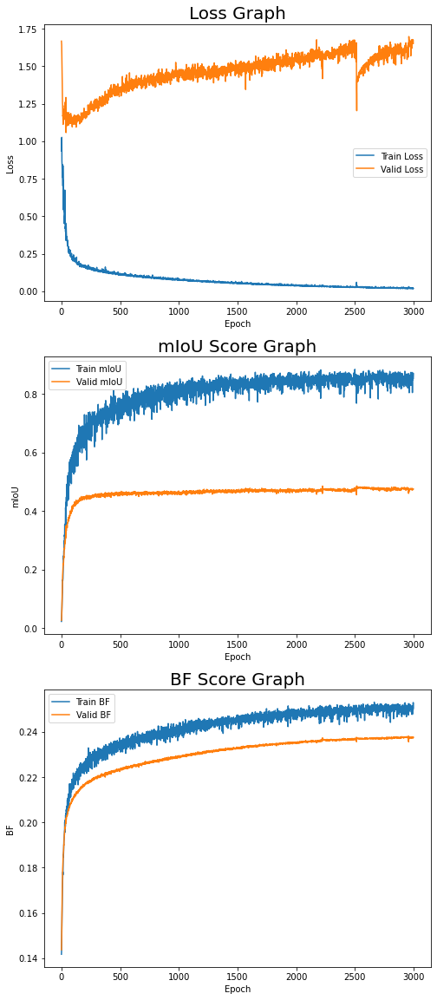

In [20]:
# check losses and miou scores graph
fig, ax = plt.subplots(3,1, figsize=(8,20))
ax[0].set_title('Loss Graph', fontsize=20)
ax[0].plot(np.arange(len(train_loss)), train_loss, label='Train Loss')
ax[0].plot(np.arange(len(valid_loss)), valid_loss, label='Valid Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].legend(loc='best')
ax[1].set_title('mIoU Score Graph', fontsize=20)
ax[1].plot(np.arange(len(train_miou)), train_miou, label='Train mIoU')
ax[1].plot(np.arange(len(valid_miou)), valid_miou, label='Valid mIoU')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('mIoU')
ax[1].legend(loc='best')
ax[2].set_title('BF Score Graph', fontsize=20)
ax[2].plot(np.arange(len(train_bf)), train_bf, label='Train BF')
ax[2].plot(np.arange(len(valid_bf)), valid_bf, label='Valid BF')
ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('BF')
ax[2].legend(loc='best')
fig.show()

# Test (마지막까지 훈련한 모델)

In [21]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [22]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.818,  Test mIoU: 0.436,  Test BF: 0.232


In [23]:
# 12 classes channels to 3 RGB channels
def map_class_to_rgb(p):
    return rgb_array[p[0]]

def mask2rgb(images):
    rgb_img_list = []
    for img in tqdm(images):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1,2,0))
        img = np.argmax(img, axis=-1)
        rgb_img = np.apply_along_axis(map_class_to_rgb, -1, np.expand_dims(img, -1))
        rgb_img_list.append(rgb_img)
    return np.array(rgb_img_list)

test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

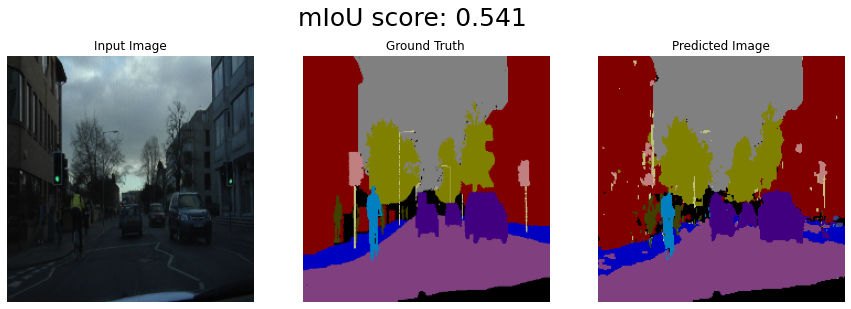

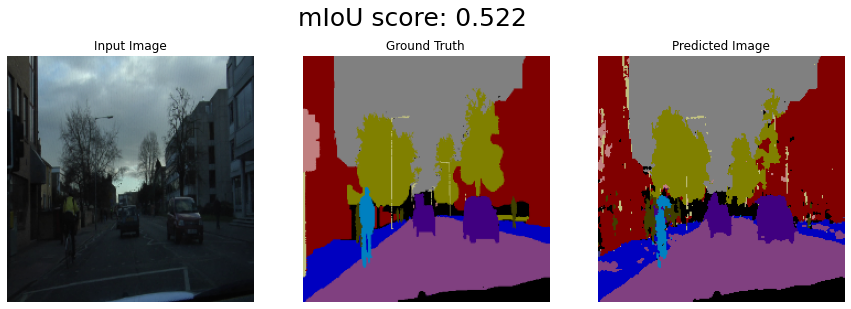

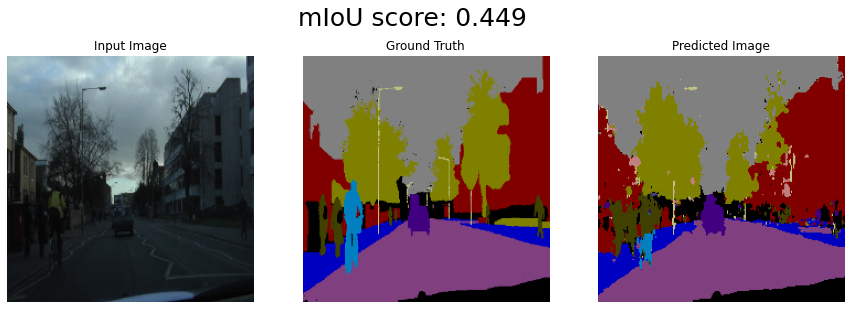

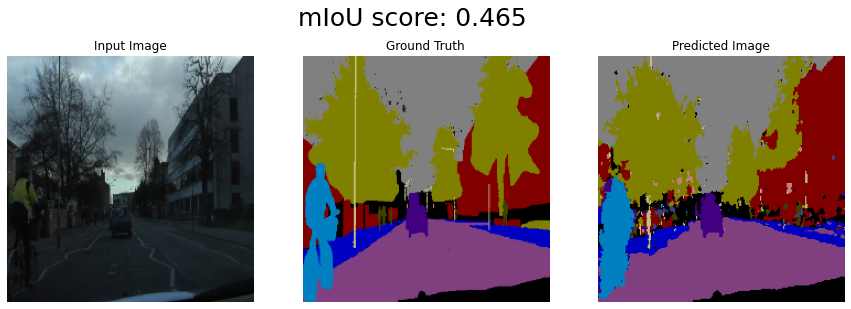

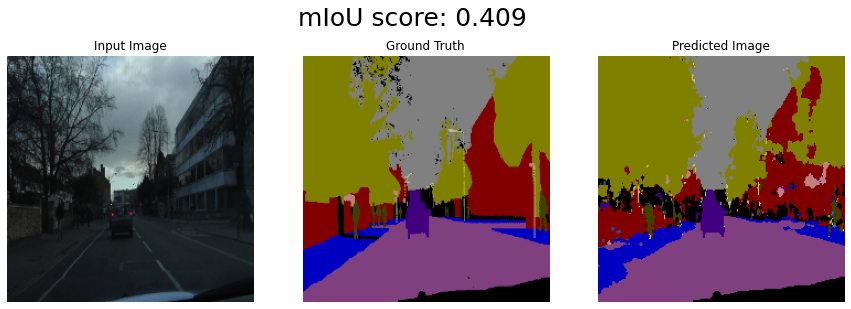

...

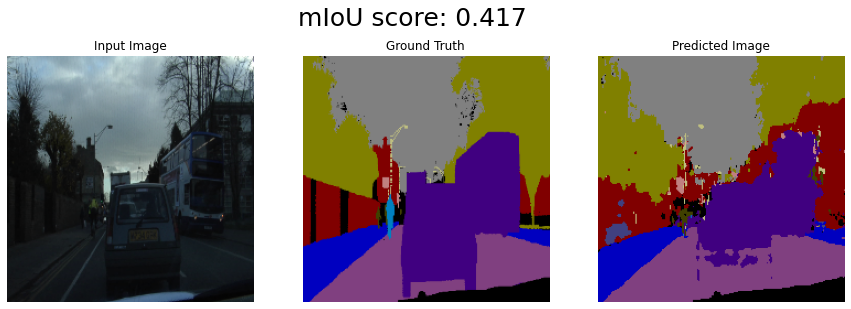

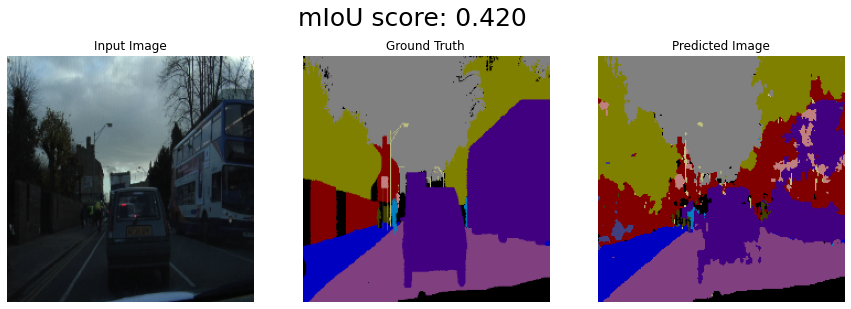

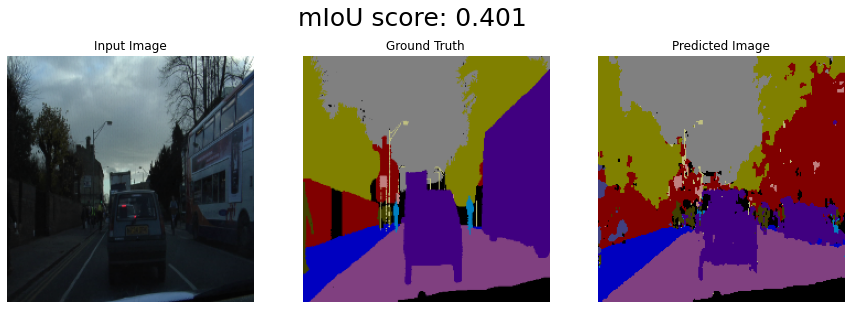

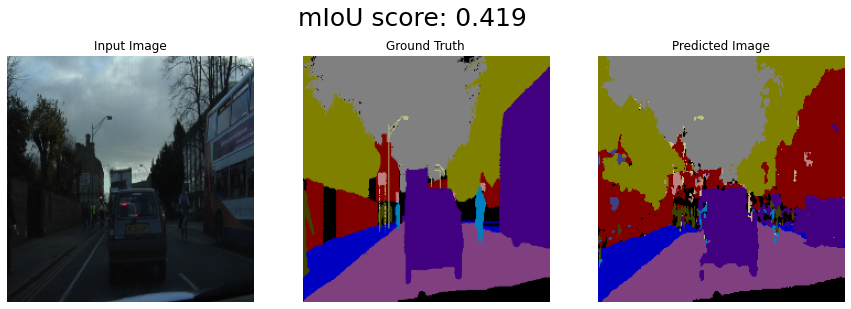

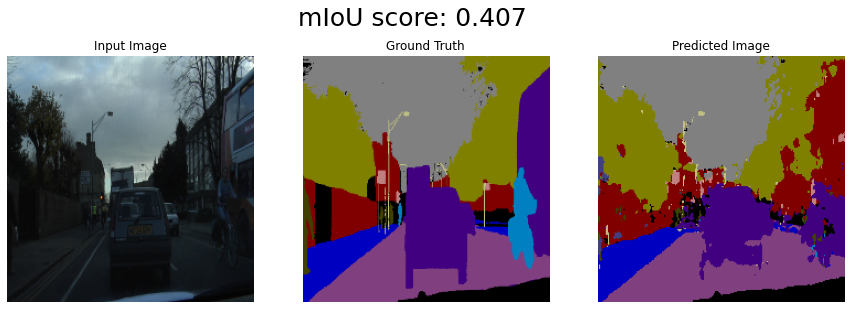

In [24]:
# show test outputs with miou score
test_metric = Metrics(n_classes=num_classes, dim=0)

def show_result(image, label, mask, model_pred, rgb_pred, ncols):
    for i in range(ncols):
        # get miou score
        miou = test_metric.get_miou(mask[i], model_pred[i])
        # plot images
        fig, ax = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'mIoU score: {miou:.3f}', fontsize=25)
        ax[0].imshow(image[i])
        ax[0].axis('off')
        ax[0].set_title('Input Image')
        ax[1].imshow(label[i])
        ax[1].axis('off')
        ax[1].set_title(f'Ground Truth')
        ax[2].imshow(rgb_pred[i])
        ax[2].axis('off')
        ax[2].set_title(f'Predicted Image')
        fig.show()

show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [25]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [26]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.020,  Train mIoU: 0.866,  Train BF: 0.251


  0%|          | 0/100 [00:00<?, ?it/s]

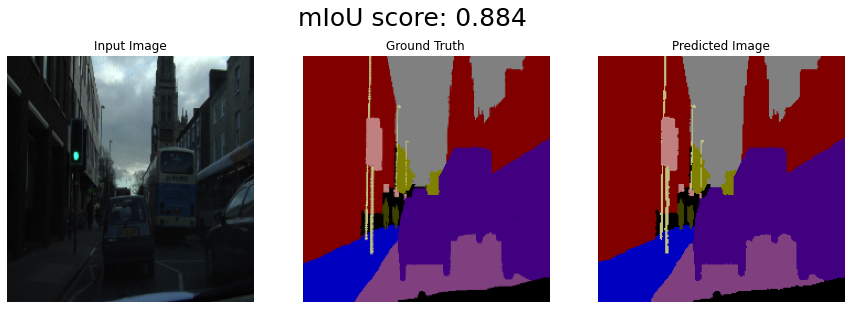

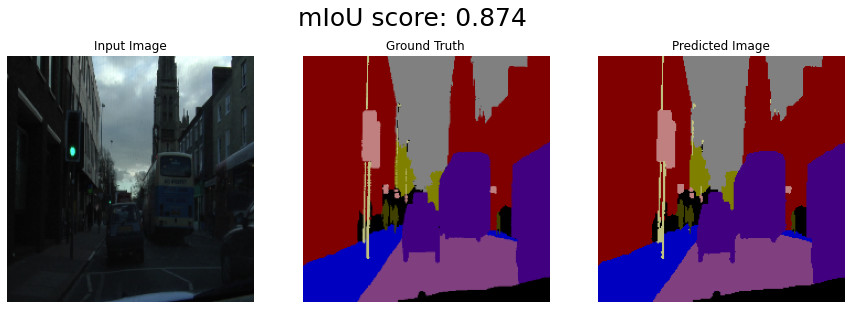

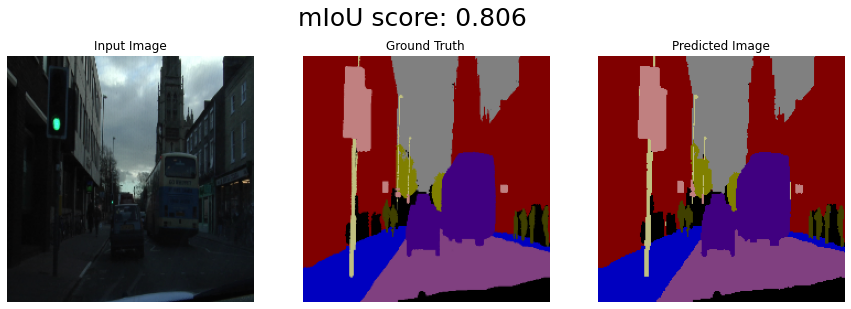

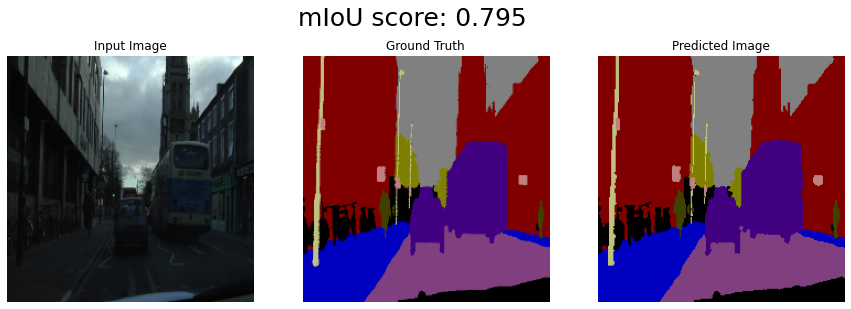

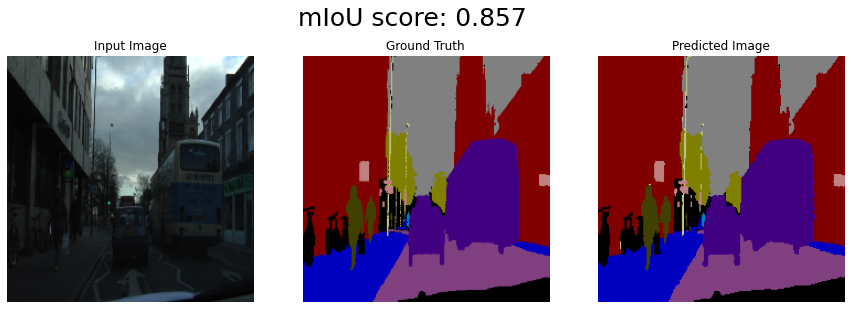

...

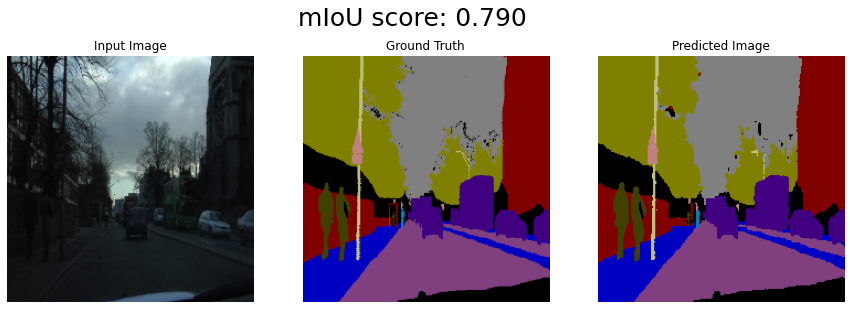

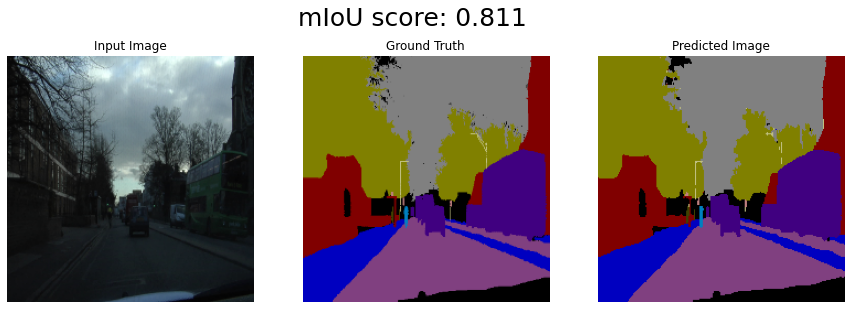

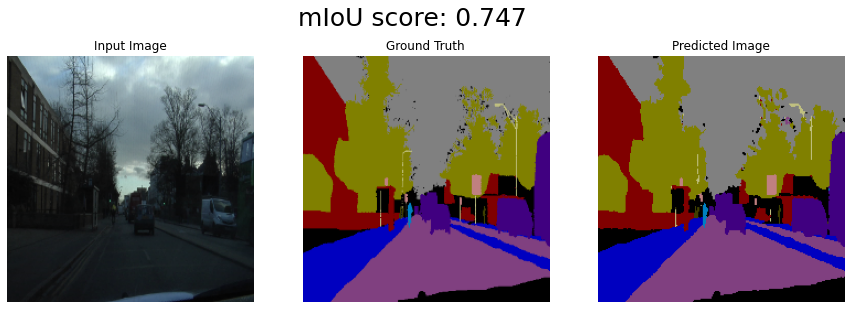

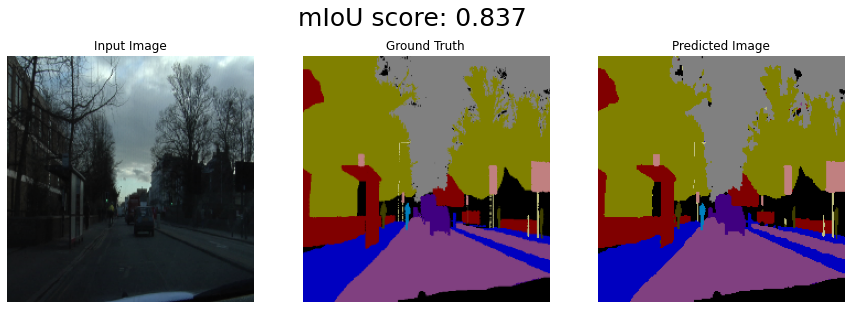

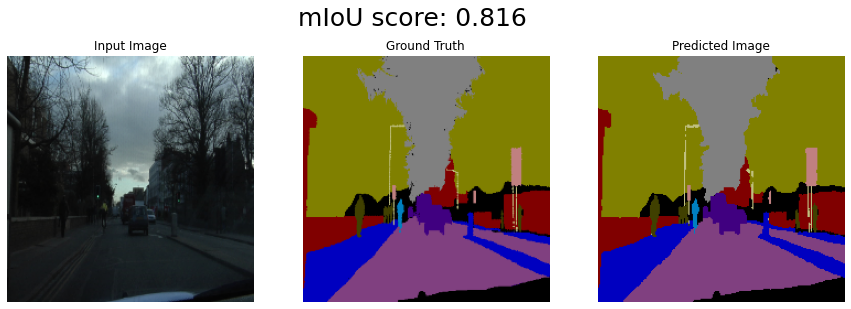

In [27]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)

# checkpoint 저장 모델

In [28]:
# load saved model
model = SegNet().to(device)
model.load_state_dict(torch.load('./model/cp_checkpoint.pt'))

<All keys matched successfully>

In [29]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [30]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.666,  Test mIoU: 0.307,  Test BF: 0.197


In [31]:
test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

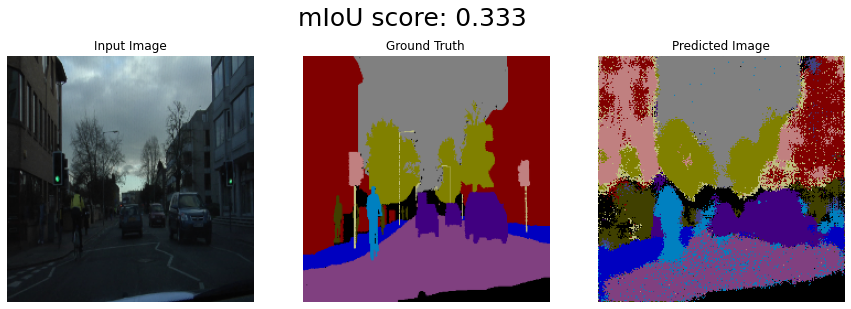

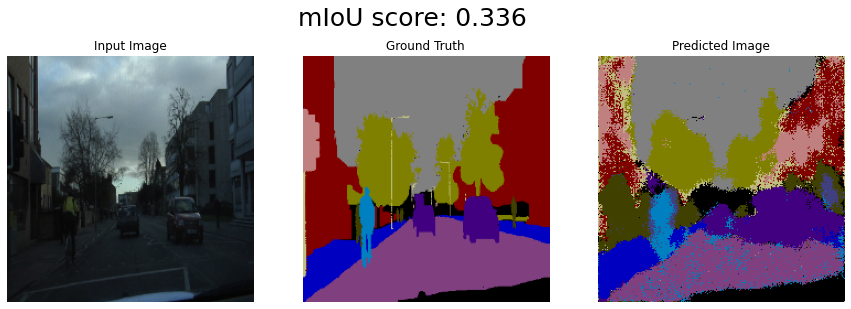

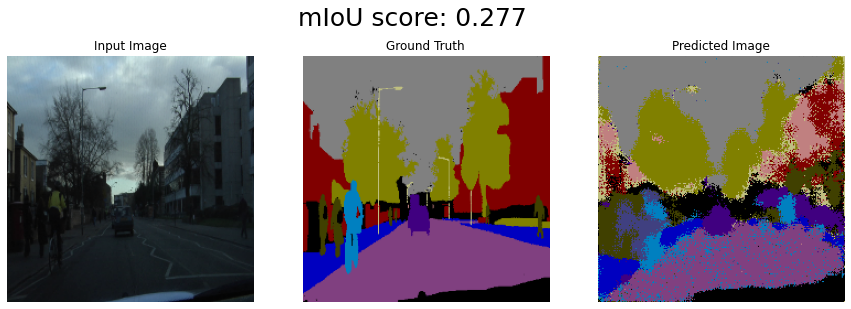

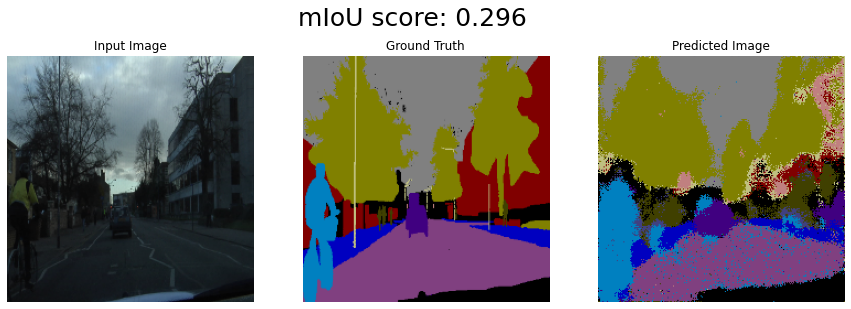

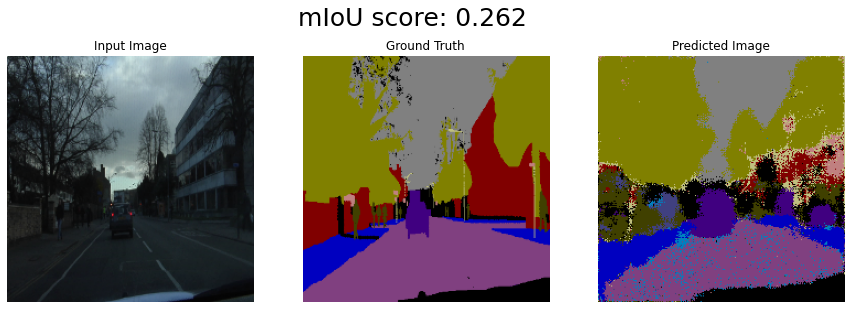

...

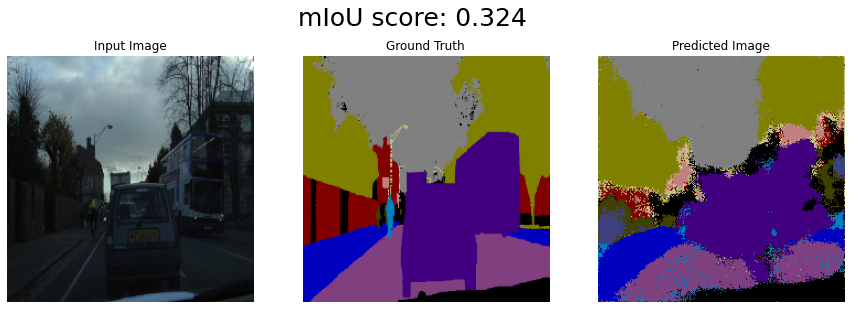

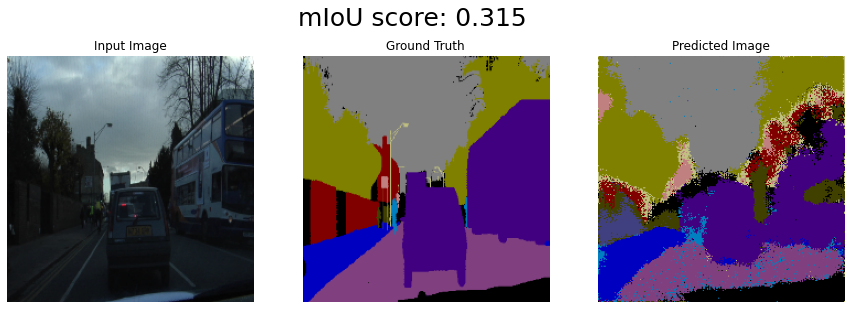

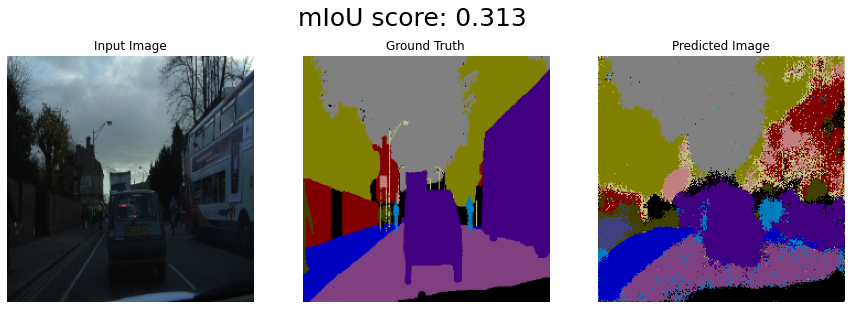

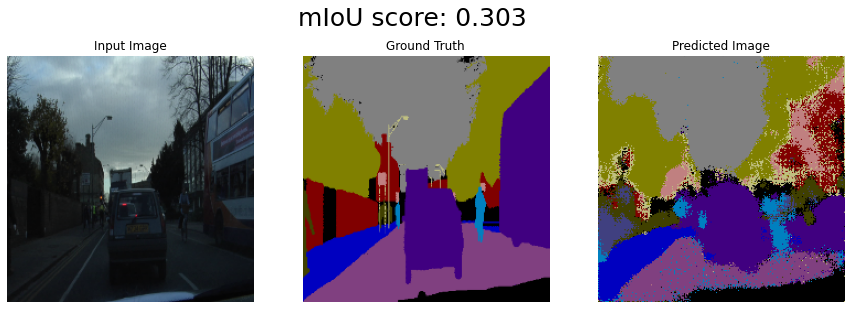

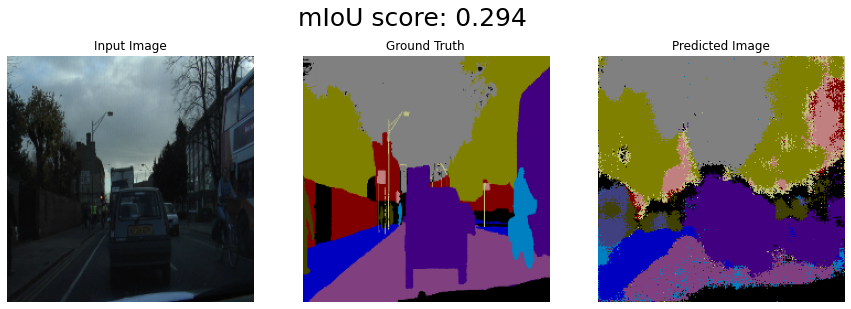

In [32]:
show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [33]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [34]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.458,  Train mIoU: 0.399,  Train BF: 0.202


  0%|          | 0/100 [00:00<?, ?it/s]

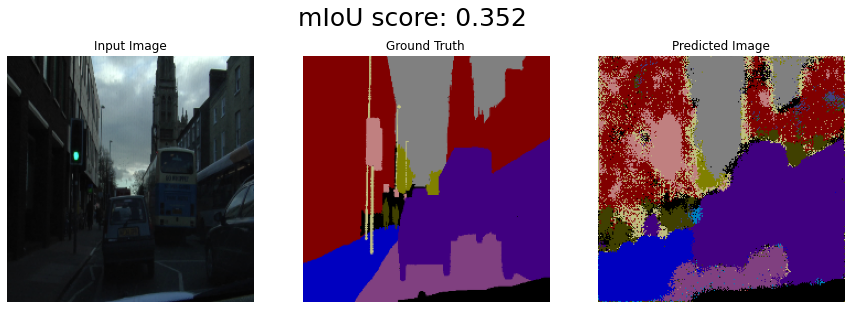

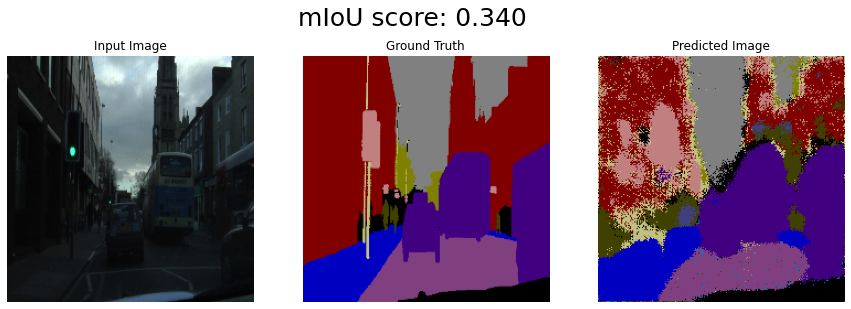

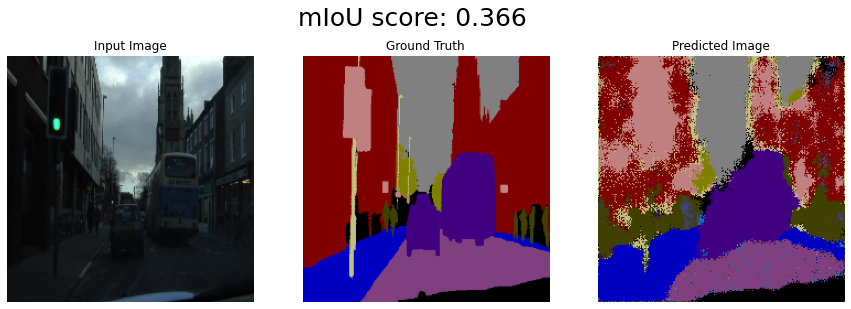

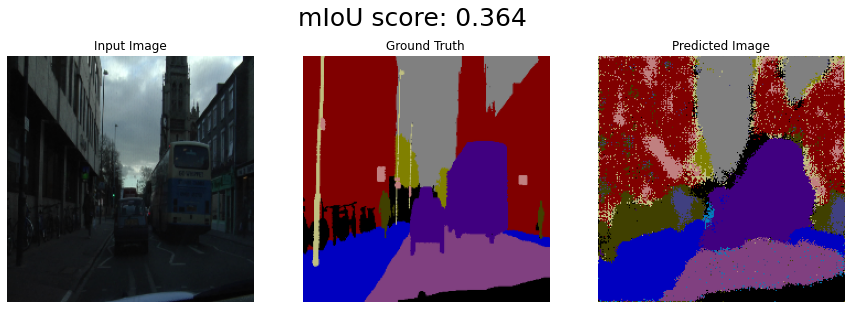

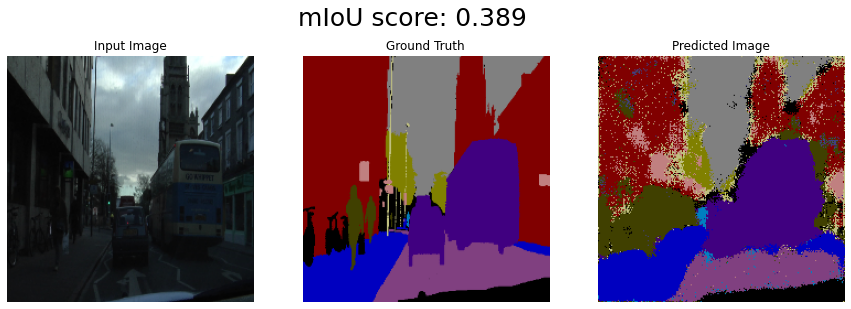

...

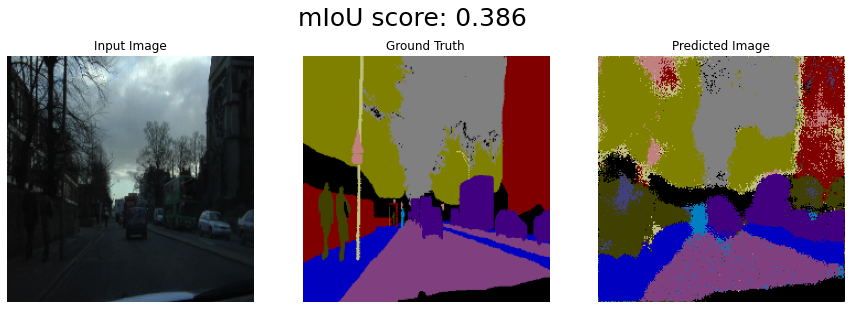

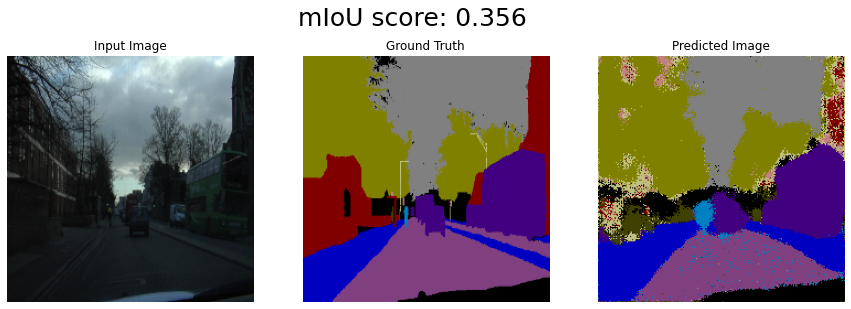

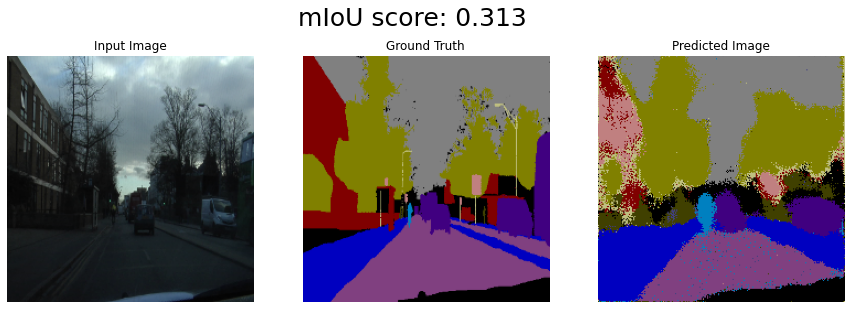

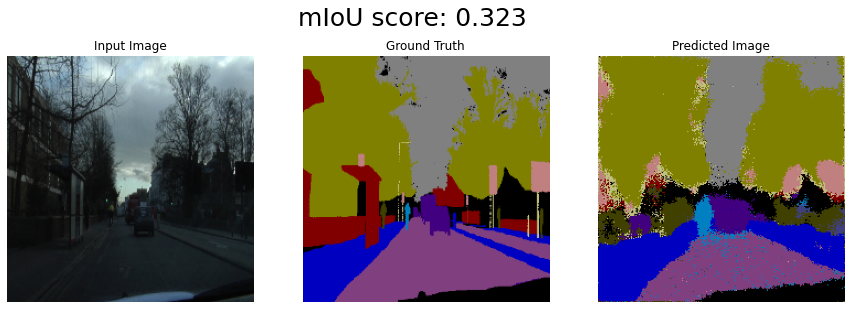

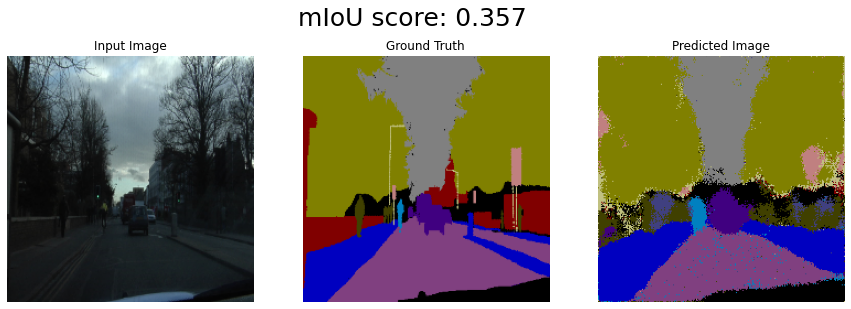

In [35]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)